In [329]:

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import json
import numpy as np
x="mid"
emotion="DA"

# df_sorted= pd.read_csv('activity_time_intersection_male.csv', header=0)
df_sorted= pd.read_csv('new_csv_with_mean_scores.csv', header=0)
# df_sorted= pd.read_csv("subset_final_data_new_GP.csv", header =0)

# df_sorted = mean_scores_df.sort_values(by='Mean Score', ascending=False)
# df_sorted= df_sorted[df_sorted['Activity'] != 'work, main job']


# df_sorted= df_sorted[df_sorted['Activity'] != 'work, main job']
df_sorted= df_sorted[df_sorted['ATUS Supercategory'] != 'work, main job']




with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Assuming df_sorted is already defined
# Convert the "activity" column to lowercase and strip trailing spaces for comparison
# df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
df_sorted["ATUS Supercategory"] = df_sorted["ATUS Supercategory"].str.lower().str.strip()

# Filter df_sorted to include only rows where the "activity" is in the unique categories
# df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]
# df_sorted = df_sorted[df_sorted["ATUS Supercategory"].isin(unique_categories)]



# male_df = df_sorted.sort_values(by=emotion, ascending=False)
male_df = df_sorted.sort_values(by='Mean Score', ascending=False)
# male_df = df_sorted.sort_values(by='Average Time Spent', ascending=False)
male_df.reset_index(drop=True, inplace=True)

# Creating a new 'Rank' column based on the new index which starts from 0
# so we add 1 to start ranking from 1
# male_df['Rank_m'] = male_df.index + 1
male_df['Rank_m'] = male_df['Mean Score'].rank(method='dense', ascending=False)
# male_df['Rank_m'] = male_df['Average Time Spent'].rank(method='dense', ascending=False)
# male_df['Rank_m'] = male_df[emotion].rank(method='dense', ascending=False)






# df_sorted= pd.read_csv(f"subset_final_data_new_{x}.csv", header =0)
# df_sorted= pd.read_csv(f'activity_time_intersection_{x}.csv', header=0)
df_sorted= pd.read_csv(f'new_csv_with_mean_scores_{x}.csv', header=0)

# df_sorted= df_sorted[df_sorted['Activity'] != 'work, main job']
df_sorted= df_sorted[df_sorted['ATUS Supercategory'] != 'work, main job']

# mean_scores_df = mean_scores_df.sort_values(by='WUMEANING', ascending=True)
# mean_scores_df= mean_scores_df[mean_scores_df['ATUS Supercategory'] != 'work, main job']


with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Assuming df_sorted is already defined
# Convert the "activity" column to lowercase and strip trailing spaces for comparison
# df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
df_sorted["ATUS Supercategory"] = df_sorted["ATUS Supercategory"].str.lower().str.strip()

# Filter df_sorted to include only rows where the "activity" is in the unique categories
# df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]
# df_sorted = df_sorted[df_sorted["ATUS Supercategory"].isin(unique_categories)]



# female_df = df_sorted.sort_values(by=emotion, ascending=False)
female_df = df_sorted.sort_values(by='Mean Score', ascending=False)
# female_df = df_sorted.sort_values(by='Average Time Spent', ascending=False)
female_df.reset_index(drop=True, inplace=True)

# Creating a new 'Rank' column based on the new index which starts from 0
# so we add 1 to start ranking from 1
# female_df['Rank_f'] = female_df.index + 1
female_df['Rank_f'] = female_df['Mean Score'].rank(method='dense', ascending=False)
# female_df['Rank_f'] = female_df['Average Time Spent'].rank(method='dense', ascending=False)
# female_df['Rank_f'] = female_df[emotion].rank(method='dense', ascending=False)




# df = pd.merge(female_df, male_df, on='Activity', how='inner')
df = pd.merge(female_df, male_df, on='ATUS Supercategory', how='inner')


# df["Mf-m"]= df["WUMEANING_x"] - df["WUMEANING_y"]
# df["Mm-f"]= df["WUMEANING_y"] - df["WUMEANING_x"]
# df["Mm-f"]= df["Mean Score_y"] - df["Mean Score_x"] 
df["Mm-f"]=df["Rank_m"] - df["Rank_f"]

# df["Hf-m"]= df["WUHAPPY_x"] - df["WUHAPPY_y"]
# df["Mm-f"]= df["WUHAPPY_y"] - df["WUHAPPY_x"]


In [330]:
df = df.sort_values(by='Mm-f', ascending=False)
max_value = df['Mm-f'].max()
min_value = df['Mm-f'].min()

print(f"Maximum value in Mm-f: {max_value}")
print(f"Minimum value in Mm-f: {min_value}")

Maximum value in Mm-f: 8.0
Minimum value in Mm-f: -7.0


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_1059/4179336269.py:97: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(wrapped_labels, fontsize=36, rotation_mode='anchor', ha='right', va='center', linespacing=0.8, fontweight=500)


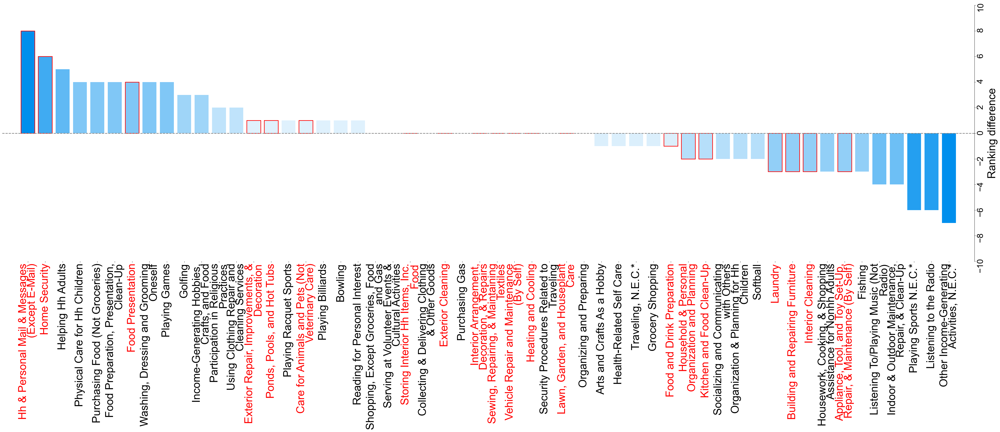

In [331]:

min, max = -10, 10
step=2


import textwrap
# Create a figure

# plt.figure(figsize=(15, 10))
# plt.figure(figsize=(46, 15))

plt.figure(figsize=(46, 20))
blue = (0.0, 0.56, 0.93)  # Blue color
white = (1.0, 1.0, 1.0)
# Create the color array based on the values in Mm-f
colors = []

min_value = df['Mm-f'].min()
max_value = df['Mm-f'].max()

# for value in df['Mm-f']:
#     if value < 0:
#         # Blue to white for negative values
#         ratio = (value + 5) / 5  # Normalize between -5 to 0
#         color = tuple(blue[i] * (1 - ratio) + white[i] * ratio for i in range(3))
#     else:
#         # White to blue for positive values
#         ratio = value / 5  # Normalize between 0 to 5
#         color = tuple(white[i] * (1 - ratio) + blue[i] * ratio for i in range(3))
    
#     colors.append(color)

for value in df['Mm-f']:
    if value < 0:
        # For negative values: create a gradient from blue (for min_value) to white (for 0)
        ratio = (value - min_value) / (0 - min_value)  # Normalize between min_value and 0
        ratio = np.clip(ratio, 0, 1)  # Ensure the ratio is between 0 and 1
        color = tuple(blue[i] * (1 - ratio) + white[i] * ratio for i in range(3))
    else:
        # For positive values: create a gradient from white (for 0) to blue (for max_value)
        ratio = (value - 0) / (max_value - 0)  # Normalize between 0 and max_value
        ratio = np.clip(ratio, 0, 1)  # Ensure the ratio is between 0 and 1
        color = tuple(white[i] * (1 - ratio) + blue[i] * ratio for i in range(3))
    
    colors.append(color)

# Create bars with the generated colors
plt.bar(df['ATUS Supercategory'], df['Mm-f'], color=colors)
# plt.bar(df['Activity'], df['Mm-f'], color=colors)

# Rotate x-ticks and set font size
plt.xticks(rotation=90, fontsize=24)

# Create twin y-axis
ax = plt.gca() 
ax2 = ax.twinx()

# Function to wrap labels

# def wrap_labels(labels, max_lines=3):
#     wrapped_labels = []
#     for label in labels:
#         # wrapped = textwrap.wrap(label, width=30)  # Adjust width as needed
#         wrapped = textwrap.wrap(label.title(), width=25)
#         wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
#     return wrapped_labels

def wrap_labels(labels, max_lines=3):
    articles = {'a', 'an', 'the', 'and', 'but', 'or', 'for', 'nor', 'on', 'at', 'to', 'by', 'with', 'in', 'of'}  # Set of articles and conjunctions to exclude
    wrapped_labels = []

    for label in labels:
        words = label.split()  # Split label into words
        title_cased_words = [
            word.title() if word.lower() not in articles else word.lower()
            for word in words
        ]
        # Ensure the first word is always capitalized (even if it's an article)
        title_cased_words[0] = title_cased_words[0].title()
        
        # Join the words back into a single string
        title_cased_label = ' '.join(title_cased_words)
        
        # Wrap the text
        wrapped = textwrap.wrap(title_cased_label, width=32)  # Adjust the width as needed
        wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines

    return wrapped_labels

# Wrap the x-axis labels
wrapped_labels = wrap_labels(df['ATUS Supercategory'])
# wrapped_labels = wrap_labels(df['Activity'])





ax.set_xticklabels(wrapped_labels, fontsize=36, rotation_mode='anchor', ha='right', va='center', linespacing=0.8, fontweight=500)


xtick_labels = ax.get_xticklabels()

# Apply color to the labels that are in the unique categories (household categories)
for tick, label in zip(xtick_labels, df['ATUS Supercategory']):
# for tick, label in zip(xtick_labels, df['Activity']):
    if label in unique_categories:
        tick.set_color('red')

import matplotlib.patches as patches


# Adding a red rectangle (bow effect) around the bars in the plot
for i, label in enumerate(df['ATUS Supercategory']):
# for i, label in enumerate(df['Activity']):
    if label in unique_categories:
        # Get the x and y position of the bar
        bar = ax.patches[i]
        # Create a red rectangle around the corresponding bar
        rect = patches.Rectangle((bar.get_x(), bar.get_y()), bar.get_width(), bar.get_height(), 
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)  # Add the red rectangle to the plot


# Refresh the plot after modifying tick labels and adding rectangles
plt.draw()


# plt.setp(ax.get_xticklabels(), rotation=90, rotation_mode='anchor')


# Set the y-axis label on the right side
ax2.set_ylabel('Ranking difference', fontsize=36, rotation=90, labelpad=10)

# Adjust the tick parameters on the right y-axis
ax2.tick_params(axis='y', labelsize=28,rotation=90)

ax.set_ylim(min, max)
ax2.set_ylim(min, max)
ax2.set_yticks(range(min, (max+1), step) )
ax2.tick_params(axis='y', labelsize=28) 

# Hide the left y-axis label and ticks
ax.yaxis.set_ticks([])  # Remove y-axis ticks on the left
ax.set_ylabel('')

ax.margins(x=0.02) 
ax2.margins(x=0.02)

# Add a horizontal line at y=0
ax.axhline(0, color='grey', linewidth=2, linestyle='--') 

# Customize the axes' spines
ax.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(True)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax2.spines['left'].set_visible(False)

# Show the plot
plt.tight_layout()
# plt.show()
# plt.savefig('household/M.pdf')
# plt.savefig(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/Household_DA_M-F.pdf')
plt.savefig(f'//Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/GPvsX/{emotion}_GP-{x}.pdf')

/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_1059/849926987.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(wrapped_labels, fontsize=22, rotation_mode='anchor', ha='right', va='center', linespacing=0.9, fontweight=500)


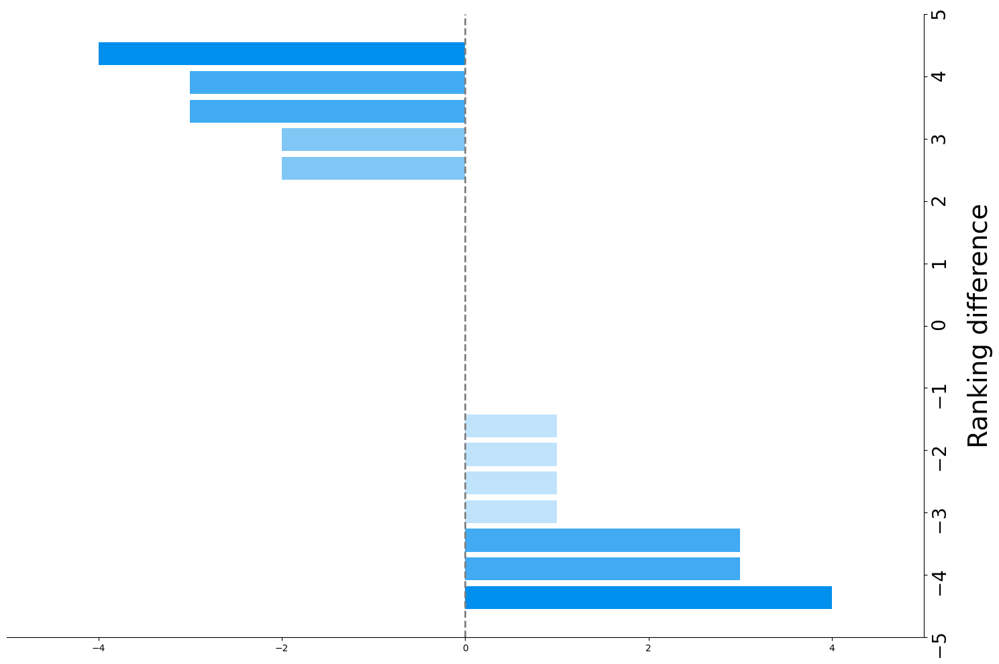

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import textwrap

min, max = -5, 5
step = 1

# Create a figure
plt.figure(figsize=(15, 10))
blue = (0.0, 0.56, 0.93)  # Blue color
white = (1.0, 1.0, 1.0)

# Create the color array based on the values in Mm-f
colors = []
min_value = df['Mm-f'].min()
max_value = df['Mm-f'].max()

for value in df['Mm-f']:
    if value < 0:
        # For negative values: create a gradient from blue (for min_value) to white (for 0)
        ratio = (value - min_value) / (0 - min_value)  # Normalize between min_value and 0
        ratio = np.clip(ratio, 0, 1)  # Ensure the ratio is between 0 and 1
        color = tuple(blue[i] * (1 - ratio) + white[i] * ratio for i in range(3))
    else:
        # For positive values: create a gradient from white (for 0) to blue (for max_value)
        ratio = (value - 0) / (max_value - 0)  # Normalize between 0 and max_value
        ratio = np.clip(ratio, 0, 1)  # Ensure the ratio is between 0 and 1
        color = tuple(white[i] * (1 - ratio) + blue[i] * ratio for i in range(3))
    
    colors.append(color)

# Create horizontal bars with the generated colors
plt.barh(df['ATUS Supercategory'], df['Mm-f'], color=colors)  # Note the use of barh for horizontal bars

# Rotate y-ticks and set font size
plt.yticks(rotation=0, fontsize=24)

# Create twin y-axis
ax = plt.gca() 
ax2 = ax.twinx()

# Function to wrap labels
def wrap_labels(labels, max_lines=2):
    wrapped_labels = []
    for label in labels:
        wrapped = textwrap.wrap(label.title(), width=30)
        wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
    return wrapped_labels

# Wrap the y-axis labels
wrapped_labels = wrap_labels(df['ATUS Supercategory'])
ax.set_yticklabels(wrapped_labels, fontsize=22, rotation_mode='anchor', ha='right', va='center', linespacing=0.9, fontweight=500)

# Set the x-axis label on the right side
ax2.set_ylabel('Ranking difference', fontsize=28, rotation=90, labelpad=20)

# Adjust the tick parameters on the right y-axis
ax2.tick_params(axis='y', labelsize=28, rotation=90)

# Set limits for the axes
ax.set_xlim(min, max)
ax2.set_ylim(min, max)
ax2.set_yticks(range(min, (max + 1), step))
ax2.tick_params(axis='y', labelsize=20)

# Hide the left y-axis label and ticks
ax.yaxis.set_ticks([])  # Remove y-axis ticks on the left
ax.set_ylabel('')

ax.margins(x=0.02) 
ax2.margins(x=0.02)

# Add a horizontal line at y=0
ax.axvline(0, color='grey', linewidth=2, linestyle='--')  # Use axvline for vertical line

# Customize the axes' spines
ax.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(True)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)  # Set bottom visible for horizontal
ax2.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax2.spines['left'].set_visible(False)

# Show the plot
plt.tight_layout()
plt.savefig(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/Household_DA_M-F.pdf')


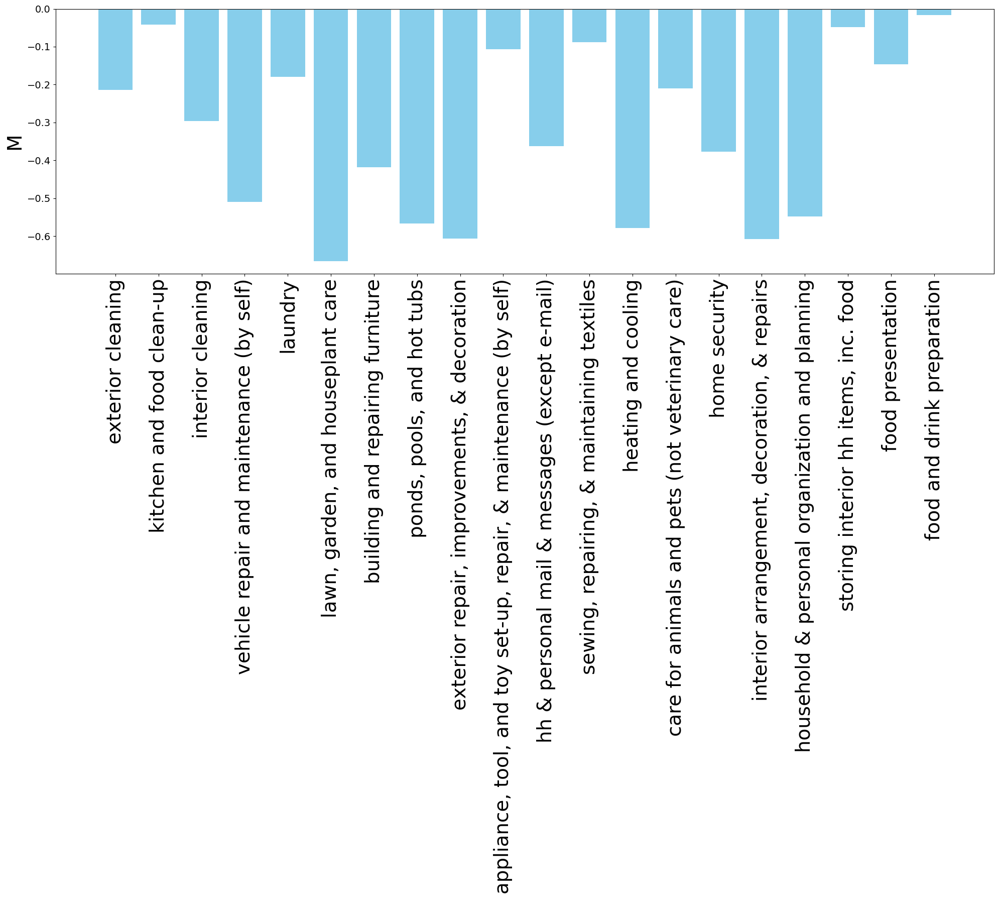

In [50]:

df = df.sort_values(by='Mean Score_y', ascending=False)
plt.figure(figsize=(20, 18))

plt.bar(df['ATUS Supercategory'], df['Mm-f'], color='skyblue')


plt.xticks(rotation=90, fontsize=28 )
# plt.tick_params(axis='x', labelsize=14)  # Set the size for x-axis tick labels
plt.tick_params(axis='y', labelsize=14)
plt.ylabel('M', fontsize=28)
# plt.xlabel('Category')
# plt.title('Desire for Automation of Household Maintenance')
# for label in plt.get_yticklabels():
#     label.set_horizontalalignment('right')

ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.tight_layout()
plt.show()
# plt.savefig('household/M.pdf')

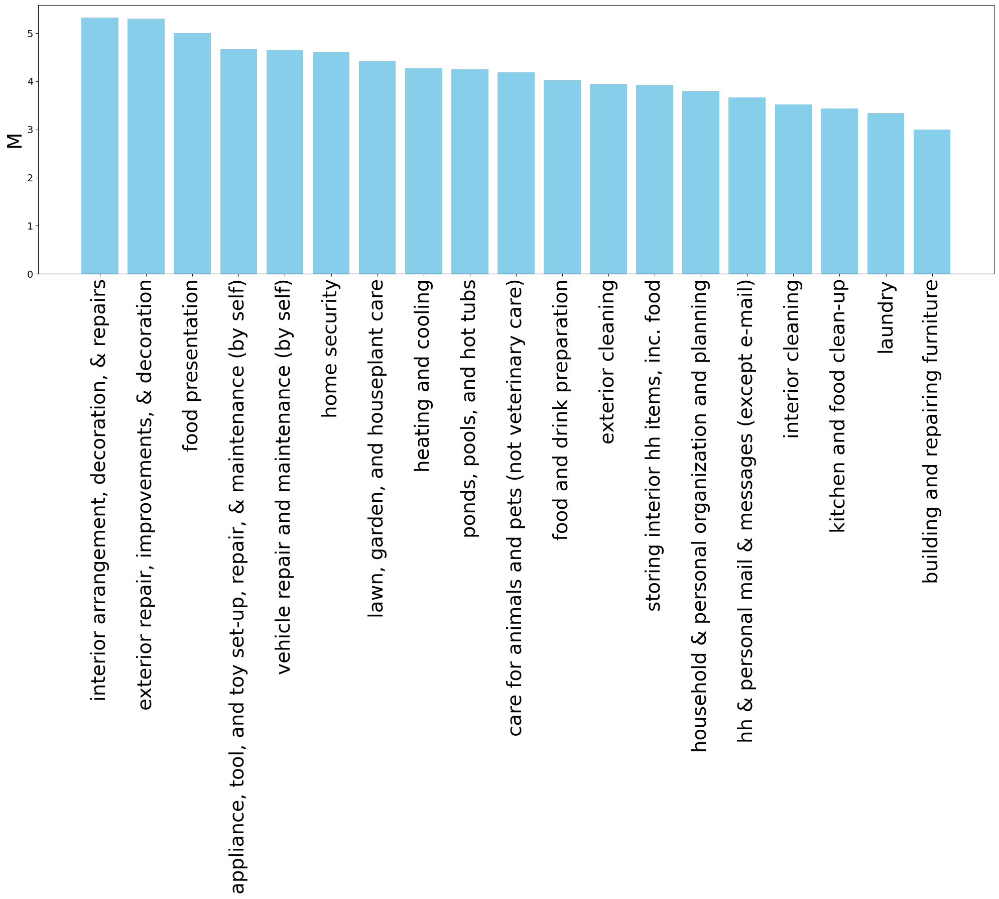

In [163]:
# df = df.sort_values(by='Mean Score_y', ascending=False)
df = df.sort_values(by='WUMEANING_y', ascending=False)

plt.figure(figsize=(20, 18))

# plt.bar(df['ATUS Supercategory'], df['Mean Score_y'], color='skyblue')
plt.bar(df['Activity'], df['WUMEANING_y'], color='skyblue')


plt.xticks(rotation=90, fontsize=28 )
# plt.tick_params(axis='x', labelsize=14)  # Set the size for x-axis tick labels
plt.tick_params(axis='y', labelsize=14)
plt.ylabel('M', fontsize=28)
# plt.xlabel('Category')
# plt.title('Desire for Automation of Household Maintenance')
# for label in plt.get_yticklabels():
#     label.set_horizontalalignment('right')

ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.tight_layout()
plt.show()

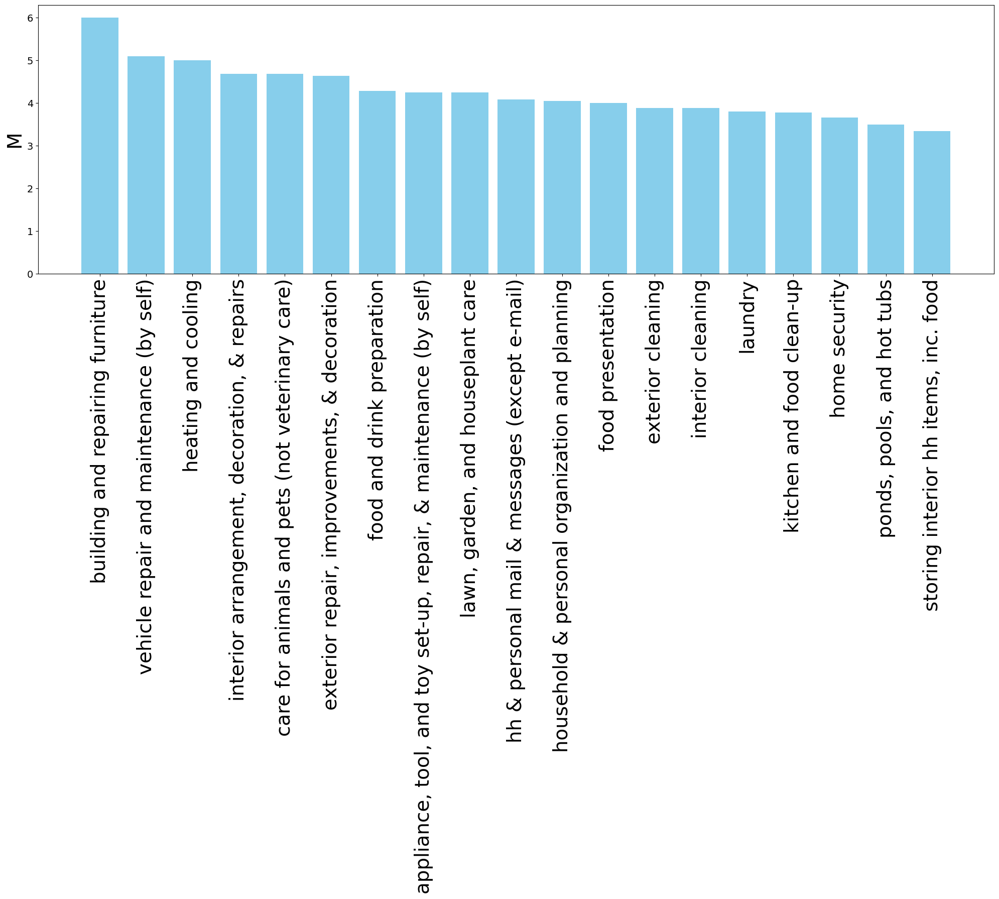

In [164]:
# df = df.sort_values(by='Mean Score_x', ascending=False)
df = df.sort_values(by='WUMEANING_x', ascending=False)

plt.figure(figsize=(20, 18))

# plt.bar(df['ATUS Supercategory'], df['Mean Score_x'], color='skyblue')
# plt.bar(df['ATUS Supercategory'], df['Mean Score_x'], color='skyblue')
plt.bar(df['Activity'], df['WUMEANING_x'], color='skyblue')

plt.xticks(rotation=90, fontsize=28 )
# plt.tick_params(axis='x', labelsize=14)  # Set the size for x-axis tick labels
plt.tick_params(axis='y', labelsize=14)
plt.ylabel('M', fontsize=28)
# plt.xlabel('Category')
# plt.title('Desire for Automation of Household Maintenance')
# for label in plt.get_yticklabels():
#     label.set_horizontalalignment('right')

ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.tight_layout()
plt.show()

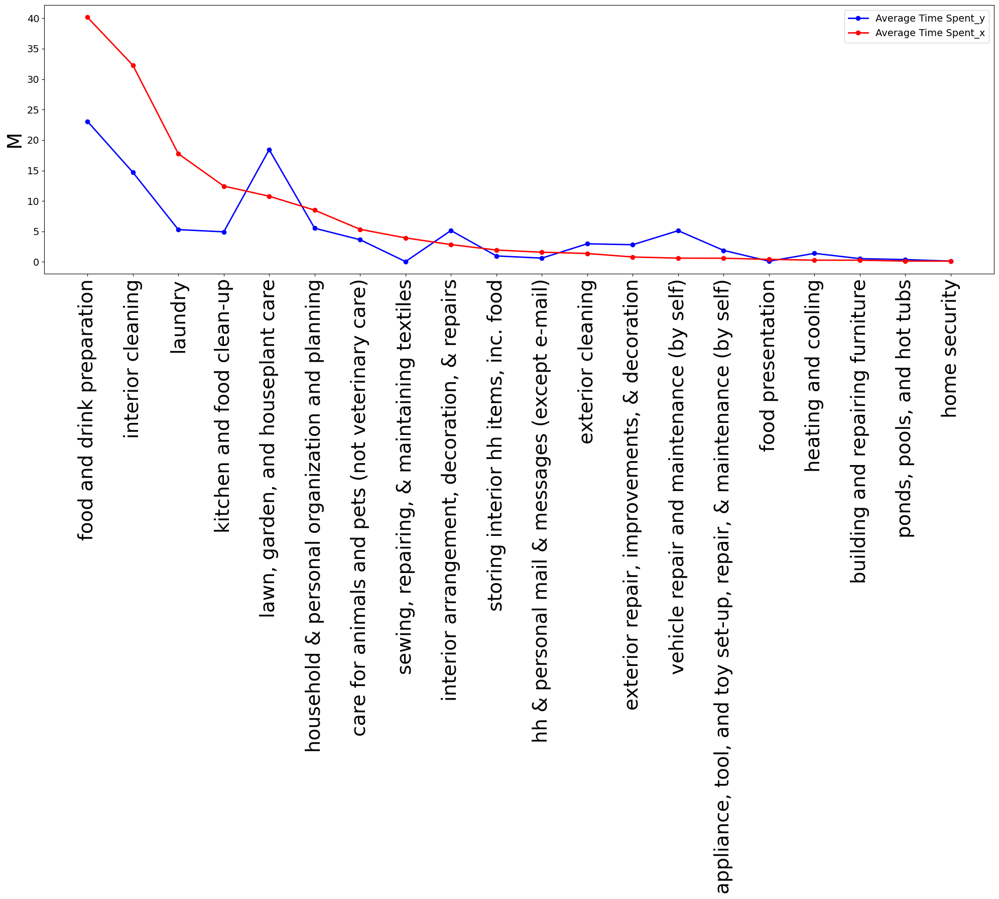

In [229]:
import matplotlib.pyplot as plt

# Assuming df is already sorted and contains 'Mean Score_x' and 'Mean Score_y' columns
# df = df.sort_values(by='Mean Score_y', ascending=False)
df = df.sort_values(by='Average Time Spent_x', ascending=False)
# df = df.sort_values(by='WUMEANING_y', ascending=False)

# df = df.sort_values(by='Mm-f', ascending=False)


plt.figure(figsize=(20, 18))

# Plotting the line graphs
# plt.plot(df['ATUS Supercategory'], df['Mean Score_y'], color='blue', marker='o', linestyle='-', linewidth=2, markersize=6, label='Mean Score_y')
# plt.plot(df['ATUS Supercategory'], df['Mean Score_x'], color='red', marker='o', linestyle='-', linewidth=2, markersize=6, label='Mean Score_x')
plt.plot(df['Activity'], df['Average Time Spent_y'], color='blue', marker='o', linestyle='-', linewidth=2, markersize=6, label='Average Time Spent_y')
plt.plot(df['Activity'], df['Average Time Spent_x'], color='red', marker='o', linestyle='-', linewidth=2, markersize=6, label='Average Time Spent_x')
# plt.plot(df['Activity'], df['WUMEANING_y'], color='blue', marker='o', linestyle='-', linewidth=2, markersize=6, label='WUMEANING_y')
# plt.plot(df['Activity'], df['WUMEANING_x'], color='red', marker='o', linestyle='-', linewidth=2, markersize=6, label='WUMEANING_x')



# Customizing the ticks and labels
plt.xticks(rotation=90, fontsize=28)
plt.tick_params(axis='y', labelsize=14)
plt.ylabel('M', fontsize=28)

# Adding a legend to differentiate the lines
plt.legend(fontsize=14)

# Customizing the axes appearance
ax = plt.gca()
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.tight_layout()
plt.show()


In [225]:
df

,Activity Code_x,Average Time Spent_x,Activity,Activity Code_y,Average Time Spent_y,Mm-f
0,20201,40.163101,food and drink preparation,20201,23.073554,-17.089546
1,20101,32.282802,interior cleaning,20101,14.709654,-17.573148
2,20102,17.759184,laundry,20102,5.304379,-12.454805
3,20203,12.447517,kitchen and food clean-up,20203,4.937334,-7.510184
4,20501,10.785426,"lawn, garden, and houseplant care",20501,18.431406,7.645980
5,20902,8.492733,household & personal organization and planning,20902,5.528672,-2.964061
6,20601,5.350828,care for animals and pets (not veterinary care),20601,3.644326,-1.706501
7,20103,3.941461,"sewing, repairing, & maintaining textiles",20103,0.054440,-3.887022
8,20301,2.843359,"interior arrangement, decoration, & repairs",20301,5.153399,2.310041
9,20104,1.948526,"storing interior hh items, inc. food",20104,0.980644,-0.967883


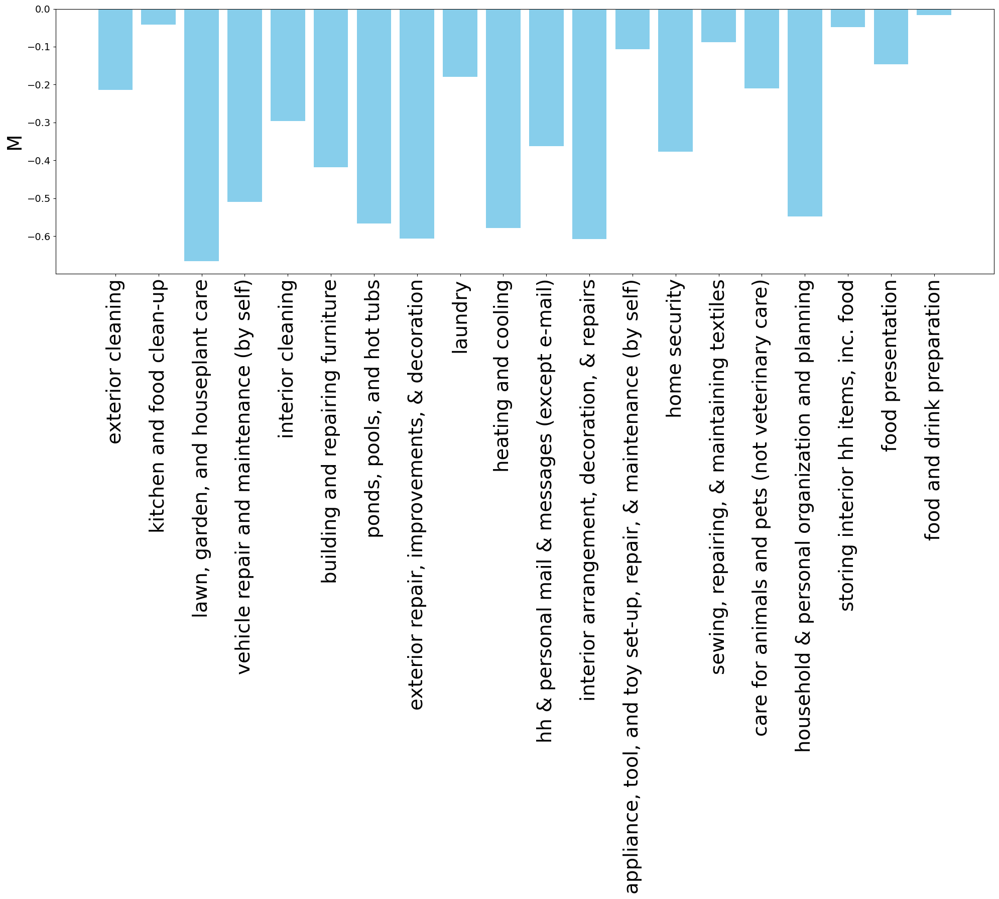

In [49]:
df = df.sort_values(by='Mean Score_x', ascending=False)
plt.figure(figsize=(20, 18))

plt.bar(df['ATUS Supercategory'], df['Mm-f'], color='skyblue')


plt.xticks(rotation=90, fontsize=28 )
# plt.tick_params(axis='x', labelsize=14)  # Set the size for x-axis tick labels
plt.tick_params(axis='y', labelsize=14)
plt.ylabel('M', fontsize=28)
# plt.xlabel('Category')
# plt.title('Desire for Automation of Household Maintenance')
# for label in plt.get_yticklabels():
#     label.set_horizontalalignment('right')

ax = plt.gca()  # Get current axes
ax.spines['top'].set_visible(True)
ax.spines['right'].set_visible(True)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.tight_layout()
plt.show()

/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_26737/80208508.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ytick_labels, fontsize=30)


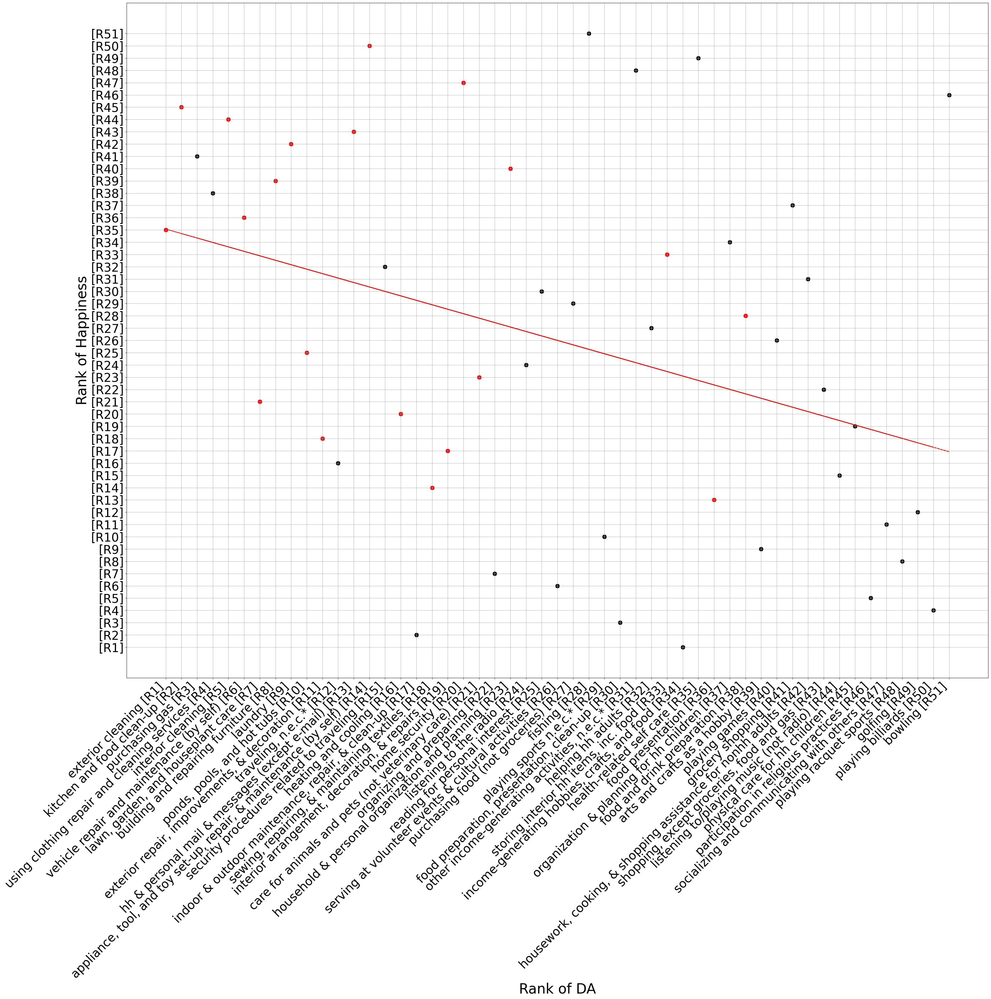

In [78]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

df_sorted = pd.read_csv("subset_final_data.csv")
mean_scores_df = pd.read_csv('new_csv_with_mean_scores.csv')

# Preprocess and sort data
df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job'].sort_values(by='WUHAPPY', ascending=True)
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'] != 'work, main job'].sort_values(by='Mean Score', ascending=True)

# Load unique categories and preprocess them
with open("test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Apply preprocessing for activity names in dataframes for comparison
df_sorted['Activity'] = df_sorted['Activity'].str.lower().str.strip()
mean_scores_df['ATUS Supercategory'] = mean_scores_df['ATUS Supercategory'].str.lower().str.strip()

# Merge dataframes based on common activities
common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['ATUS Supercategory'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'].isin(common_tasks)]

# Sorting and ranking
mean_scores_df = mean_scores_df.sort_values(by='Mean Score', ascending=False)
mean_scores_df['Rank_DA'] = np.arange(1, len(mean_scores_df) + 1)

df_sorted = df_sorted.sort_values(by='WUHAPPY', ascending=False)
df_sorted['Rank_Time'] = np.arange(1, len(df_sorted) + 1)

merged_df = pd.merge(mean_scores_df, df_sorted, left_on='ATUS Supercategory', right_on='Activity')

# Plotting
fig, ax = plt.subplots(figsize=(35, 35))
for i, row in merged_df.iterrows():
    color = 'red' if row['Activity'] in unique_categories else 'black'
    ax.scatter(row['Rank_DA'], row['Rank_Time'], color=color, s=100)

ax.set_xlabel('Rank of DA', fontsize=35)
ax.set_ylabel('Rank of Happiness', fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=30)

ax.set_xticks(np.arange(1, len(merged_df) + 1))
xtick_labels = [f"{act} [R{rank}]" for act, rank in zip(merged_df["Activity"], merged_df["Rank_DA"])]
ax.set_xticklabels(xtick_labels, rotation=45, ha='right', fontsize=30)


ytick_labels = [f"[R{rank}]" for rank in merged_df["Rank_DA"]]
ax.set_yticklabels(ytick_labels, fontsize=30)
ax.set_yticks(np.arange(1, len(merged_df) + 1))

# Trendline
z = np.polyfit(merged_df['Rank_Time'], merged_df['Rank_DA'], 1)
p = np.poly1d(z)
plt.plot(merged_df['Rank_Time'], p(merged_df['Rank_Time']), "r--")

plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

df_sorted = pd.read_csv("subset_final_data.csv")
mean_scores_df = pd.read_csv('new_csv_with_mean_scores.csv')

# Preprocess and sort data
df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job'].sort_values(by='WUHAPPY', ascending=True)
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'] != 'work, main job'].sort_values(by='Mean Score', ascending=True)

# Load unique categories and preprocess them
with open("test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Apply preprocessing for activity names in dataframes for comparison
df_sorted['Activity'] = df_sorted['Activity'].str.lower().str.strip()
mean_scores_df['ATUS Supercategory'] = mean_scores_df['ATUS Supercategory'].str.lower().str.strip()

# Merge dataframes based on common activities
common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['ATUS Supercategory'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'].isin(common_tasks)]

# Sorting and ranking
mean_scores_df = mean_scores_df.sort_values(by='Mean Score', ascending=False)
mean_scores_df['Rank_DA'] = np.arange(1, len(mean_scores_df) + 1)

df_sorted = df_sorted.sort_values(by='WUHAPPY', ascending=False)
df_sorted['Rank_Time'] = np.arange(1, len(df_sorted) + 1)

merged_df = pd.merge(mean_scores_df, df_sorted, left_on='ATUS Supercategory', right_on='Activity')

# Perform K-means clustering
n_clusters = 4  # for example, 3 clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(merged_df[['Rank_DA', 'Rank_Time']])
merged_df['Cluster'] = kmeans.labels_

# Plotting with clustering
fig, ax = plt.subplots(figsize=(35, 35))
colors = plt.cm.viridis(np.linspace(0, 1, n_clusters))  # Get color map for clusters

# Scatter plot with clustering colors and 'x' markers for specific categories
for i, row in merged_df.iterrows():
    if row['Activity'] in unique_categories:
        ax.scatter(row['Rank_DA'], row['Rank_Time'], color=colors[row['Cluster']], marker='x', s=200)
    else:
        ax.scatter(row['Rank_DA'], row['Rank_Time'], color=colors[row['Cluster']], s=200)

ax.set_xlabel('Rank of DA', fontsize=35)
ax.set_ylabel('Rank of Happiness', fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=30)

ax.set_xticks(np.arange(1, len(merged_df) + 1))
xtick_labels = [f"{act} [R{rank}]" for act, rank in zip(merged_df["Activity"], merged_df["Rank_DA"])]
ax.set_xticklabels(xtick_labels, rotation=45, ha='right', fontsize=30)

ytick_labels = [f"[R{rank}]" for rank in range(1, len(merged_df) + 1)]
ax.set_yticks(np.arange(1, len(merged_df) + 1))
ax.set_yticklabels(ytick_labels, fontsize=30)

# Trendline
z = np.polyfit(merged_df['Rank_Time'], merged_df['Rank_DA'], 1)
p = np.poly1d(z)
plt.plot(merged_df['Rank_Time'], p(merged_df['Rank_Time']), "r--")

plt.grid(True)
plt.tight_layout()
# plt.show()


/Users/ruchiraray/opt/anaconda3/envs/cml/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


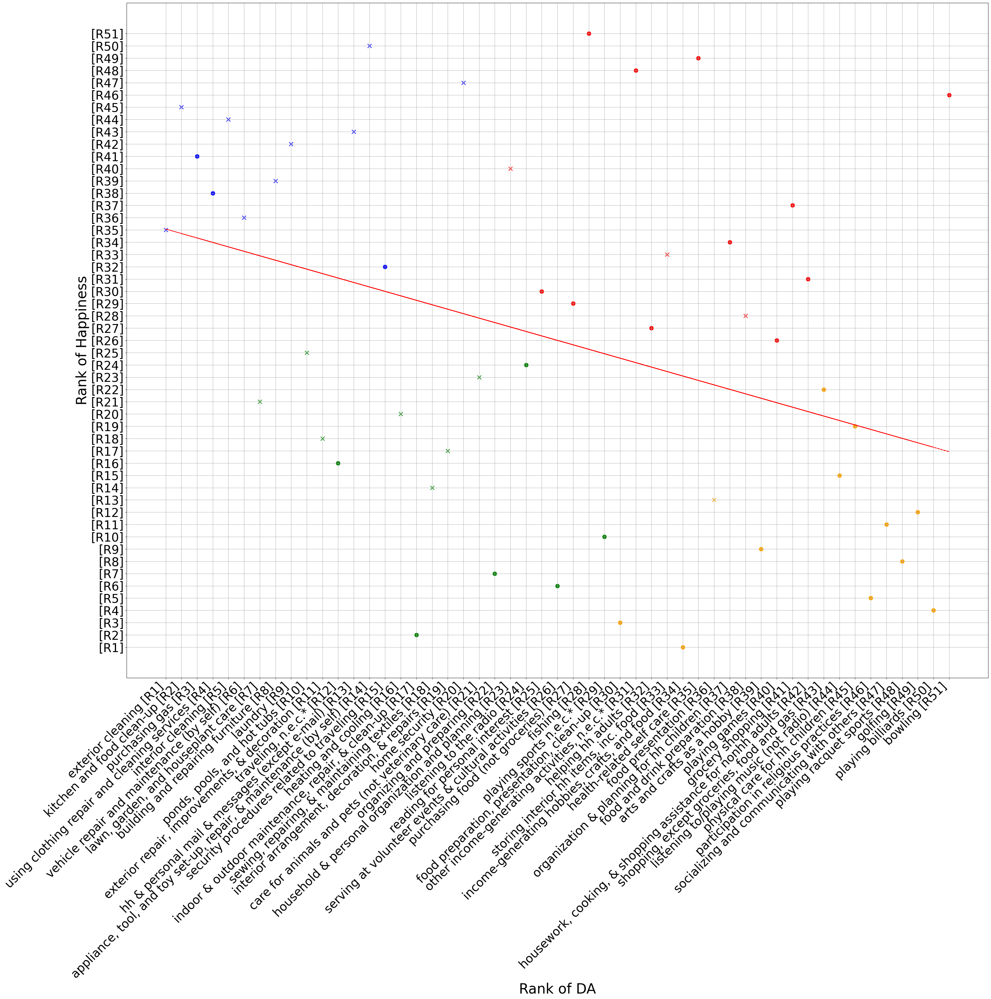

Cluster color red contains activities: ['household & personal organization and planning', 'reading for personal interest', 'purchasing food (not groceries)', 'fishing', 'other income-generating activities, n.e.c.*', 'helping hh adults', 'storing interior hh items, inc. food', 'health-related self care', 'organization & planning for hh children', 'food and drink preparation', 'playing games', 'grocery shopping', 'housework, cooking, & shopping assistance for nonhh adults', 'bowling']
Cluster color green contains activities: ['lawn, garden, and houseplant care', 'ponds, pools, and hot tubs', 'exterior repair, improvements, & decoration', 'traveling, n.e.c.*', 'heating and cooling', 'indoor & outdoor maintenance, repair, & clean-up', 'sewing, repairing, & maintaining textiles', 'interior arrangement, decoration, & repairs', 'care for animals and pets (not veterinary care)', 'organizing and preparing', 'listening to the radio', 'serving at volunteer events & cultural activities', 'playing 

In [219]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Load your data
df_sorted = pd.read_csv("subset_final_data.csv")
mean_scores_df = pd.read_csv('new_csv_with_mean_scores.csv')

# Preprocess and sort data
df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job'].sort_values(by='WUHAPPY', ascending=True)
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'] != 'work, main job'].sort_values(by='Mean Score', ascending=True)

# Load unique categories and preprocess them
with open("test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Apply preprocessing for activity names in dataframes for comparison
df_sorted['Activity'] = df_sorted['Activity'].str.lower().str.strip()
mean_scores_df['ATUS Supercategory'] = mean_scores_df['ATUS Supercategory'].str.lower().str.strip()

# Merge dataframes based on common activities
common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['ATUS Supercategory'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'].isin(common_tasks)]

# Sorting and ranking
mean_scores_df = mean_scores_df.sort_values(by='Mean Score', ascending=False)
mean_scores_df['Rank_DA'] = np.arange(1, len(mean_scores_df) + 1)

df_sorted = df_sorted.sort_values(by='WUHAPPY', ascending=False)
df_sorted['Rank_Time'] = np.arange(1, len(df_sorted) + 1)

merged_df = pd.merge(mean_scores_df, df_sorted, left_on='ATUS Supercategory', right_on='Activity')

# Perform K-means clustering
n_clusters = 4  # Adjust number of clusters as necessary
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(merged_df[['Rank_DA', 'Rank_Time']])
merged_df['Cluster'] = kmeans.labels_

# Define stark colors for clusters
colors = ['red', 'green', 'blue', "orange"]  # Example stark colors
# colors = plt.cm.viridis(np.linspace(0, 1, n_clusters)) 

# Plotting with stark colors
fig, ax = plt.subplots(figsize=(35, 35))

cluster_activities = {color: [] for color in colors}

for i, row in merged_df.iterrows():
    marker = 'x' if row['Activity'] in unique_categories else 'o'
    color = colors[row['Cluster']]
    ax.scatter(row['Rank_DA'], row['Rank_Time'], color=color, marker=marker, s=100)
    cluster_activities[color].append(row['Activity'])

ax.set_xlabel('Rank of DA', fontsize=35)
ax.set_ylabel('Rank of Happiness', fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=30)

ax.set_xticks(np.arange(1, len(merged_df) + 1))
xtick_labels = [f"{act} [R{rank}]" for act, rank in zip(merged_df["Activity"], merged_df["Rank_DA"])]
ax.set_xticklabels(xtick_labels, rotation=45, ha='right', fontsize=30)

ytick_labels = [f"[R{rank}]" for rank in range(1, len(merged_df) + 1)]
ax.set_yticks(np.arange(1, len(merged_df) + 1))
ax.set_yticklabels(ytick_labels, fontsize=30)

# Trendline
z = np.polyfit(merged_df['Rank_Time'], merged_df['Rank_DA'], 1)
p = np.poly1d(z)
plt.plot(merged_df['Rank_Time'], p(merged_df['Rank_Time']), "r--")

plt.grid(True)
plt.tight_layout()
plt.show()

# Print activities in each cluster
for color, activities in cluster_activities.items():
    print(f"Cluster color {color} contains activities: {activities}")


In [91]:
for color, activities in cluster_activities.items():
    filtered_activities = [act for act in activities if act in unique_categories]
    print(f"Cluster color {color} contains {len(filtered_activities)}activities from ATUS_test: {filtered_activities}")

Cluster color red contains 3 activities from ATUS_test: ['household & personal organization and planning', 'storing interior hh items, inc. food', 'food and drink preparation']
Cluster color green contains 7 activities from ATUS_test: ['lawn, garden, and houseplant care', 'ponds, pools, and hot tubs', 'exterior repair, improvements, & decoration', 'heating and cooling', 'sewing, repairing, & maintaining textiles', 'interior arrangement, decoration, & repairs', 'care for animals and pets (not veterinary care)']
Cluster color blue contains 9 activities from ATUS_test: ['exterior cleaning', 'kitchen and food clean-up', 'interior cleaning', 'vehicle repair and maintenance (by self)', 'building and repairing furniture', 'laundry', 'hh & personal mail & messages (except e-mail)', 'appliance, tool, and toy set-up, repair, & maintenance (by self)', 'home security']
Cluster color orange contains 1 activities from ATUS_test: ['food presentation']


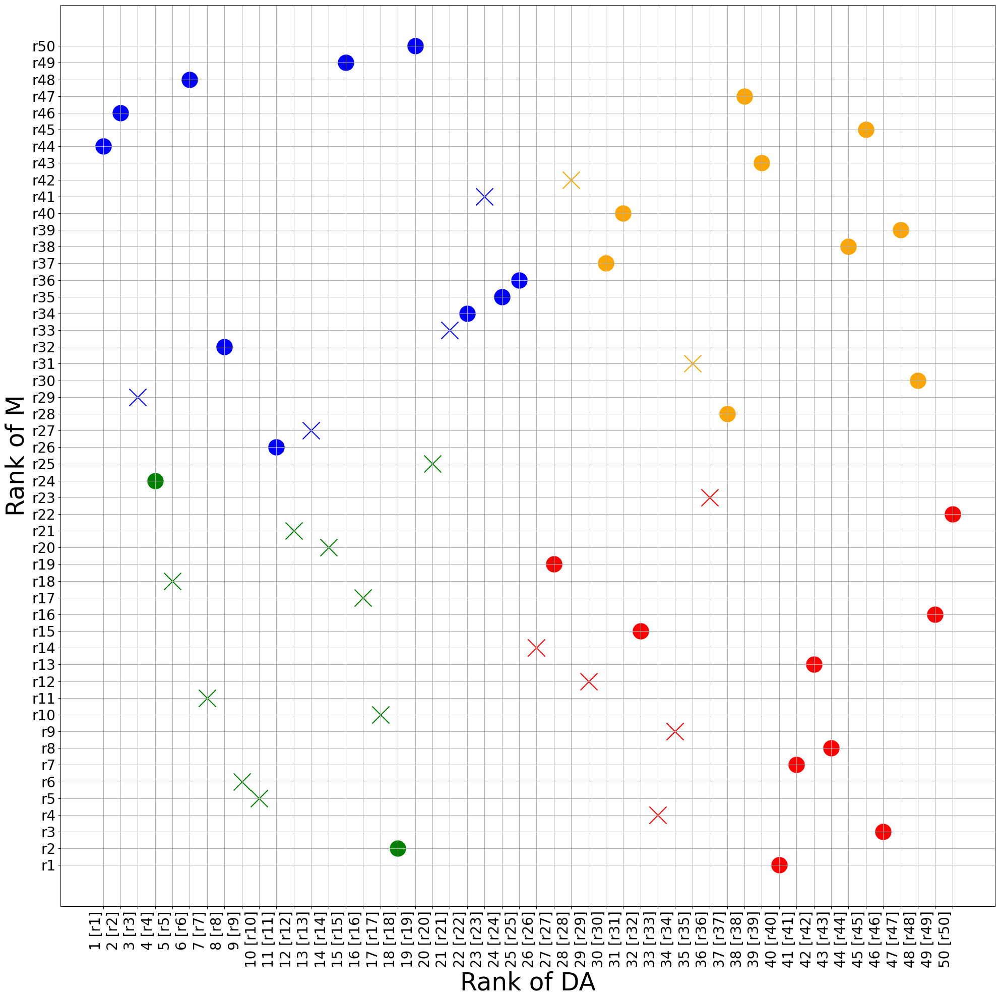

Top-right has 11 activities.
Top-left has 14 activities.
Bottom-left has 11 activities.
Bottom-right has 14 activities.


In [266]:
fig, ax = plt.subplots(figsize=(20, 20))

# Load your data
# df_sorted = pd.read_csv("subset_final_data_high.csv")
mean_scores_df = pd.read_csv('new_csv_with_mean_scores_.csv')
df_sorted  = pd.read_csv('activity_time_intersection_high.csv')

# Preprocess and sort data
# df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job'].sort_values(by='WUHAPPY', ascending=True)
# df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job'].sort_values(by='WUMEANING', ascending=True)
df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job'].sort_values(by='Average Time Spent', ascending=True)


mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'] != 'work, main job'].sort_values(by='Mean Score', ascending=True)

# Load unique categories and preprocess them
with open("test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Apply preprocessing for activity names in dataframes for comparison
df_sorted['Activity'] = df_sorted['Activity'].str.lower().str.strip()
mean_scores_df['ATUS Supercategory'] = mean_scores_df['ATUS Supercategory'].str.lower().str.strip()

# Merge dataframes based on common activities
common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['ATUS Supercategory'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'].isin(common_tasks)]

# Sorting and ranking
mean_scores_df = mean_scores_df.sort_values(by='Mean Score', ascending=False)
mean_scores_df['Rank_DA'] = np.arange(1, len(mean_scores_df) + 1)

# df_sorted = df_sorted.sort_values(by='WUHAPPY', ascending=False)
# df_sorted = df_sorted.sort_values(by='WUMEANING', ascending=False)
df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=False)

df_sorted['Rank_Time'] = np.arange(1, len(df_sorted) + 1)

merged_df = pd.merge(mean_scores_df, df_sorted, left_on='ATUS Supercategory', right_on='Activity')

quadrant_activities = {
    'Top-right': [],
    'Top-left': [],
    'Bottom-left': [],
    'Bottom-right': []
}

# Define the quadrants based on median values
median_da = merged_df['Rank_DA'].median()
median_time = merged_df['Rank_Time'].median()
 
# Colors for each quadrant
colors = ['red', 'green', 'blue', 'orange']  # Top-right, Top-left, Bottom-left, Bottom-right

# Counters for each quadrant
quadrant_counts = {'Top-right': 0, 'Top-left': 0, 'Bottom-left': 0, 'Bottom-right': 0}

for i, row in merged_df.iterrows():
    if row['Rank_DA'] >= median_da and row['Rank_Time'] <= median_time:
        quadrant = 'Bottom-right'
        color = colors[0]
    elif row['Rank_DA'] < median_da and row['Rank_Time'] <= median_time:
        quadrant = 'Bottom-left'
        color = colors[1]
    elif row['Rank_DA'] < median_da and row['Rank_Time'] > median_time:
        quadrant = 'Top-left'
        color = colors[2]
    elif row['Rank_DA'] >= median_da and row['Rank_Time'] > median_time:
        quadrant = 'Top-right'
        color = colors[3]

    # Check if the activity is in unique_categories and set the marker style
    if row['Activity'] in unique_categories:
        marker = 'x'  # Use 'x' marker for activities in unique_categories
        size = 600  # Increase the size for better visibility
    else:
        marker = 'o'  # Use 'o' marker for other activities
        size = 500  # Regular size for other points

    ax.scatter(row['Rank_DA'], row['Rank_Time'], color=color, marker=marker, s=size)
    quadrant_counts[quadrant] += 1
    quadrant_activities[quadrant].append(row['Activity'])

ax.set_xlabel('Rank of DA', fontsize=35)
ax.set_ylabel('Rank of M', fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=30)

ax.set_xticks(np.arange(1, len(merged_df) + 1))
# xtick_labels = [f"{act} [R{rank}]" for act, rank in zip(merged_df["Activity"], merged_df["Rank_DA"])]
xtick_labels = [f"{rank} [r{rank}]" for act, rank in zip(merged_df["Activity"], merged_df["Rank_DA"])]

ax.set_xticklabels(xtick_labels, rotation=90, ha='right', fontsize=20)

ytick_labels = [f"r{rank}" for rank in range(1, len(merged_df) + 1)]
ax.set_yticks(np.arange(1, len(merged_df) + 1))
ax.set_yticklabels(ytick_labels, fontsize=20)

plt.grid(True)
plt.tight_layout()
plt.show()

# Print the count of activities in each quadrant
for quadrant, count in quadrant_counts.items():
    print(f"{quadrant} has {count} activities.")


In [267]:


# Filter and print activities from unique_categories in each quadrant
for quadrant, activities in quadrant_activities.items():
    filtered_activities = [act for act in activities if act.lower() in unique_categories]
    print(f"{quadrant} contains {len(filtered_activities)} activities from ATUS_test: {filtered_activities}")


Top-right contains 2 activities from ATUS_test: ['home security', 'storing interior hh items, inc. food']
Top-left contains 4 activities from ATUS_test: ['building and repairing furniture', 'appliance, tool, and toy set-up, repair, & maintenance (by self)', 'ponds, pools, and hot tubs', 'food presentation']
Bottom-left contains 9 activities from ATUS_test: ['exterior cleaning', 'kitchen and food clean-up', 'lawn, garden, and houseplant care', 'interior cleaning', 'vehicle repair and maintenance (by self)', 'exterior repair, improvements, & decoration', 'sewing, repairing, & maintaining textiles', 'laundry', 'heating and cooling']
Bottom-right contains 5 activities from ATUS_test: ['care for animals and pets (not veterinary care)', 'interior arrangement, decoration, & repairs', 'food and drink preparation', 'household & personal organization and planning', 'hh & personal mail & messages (except e-mail)']


In [111]:
fig, ax = plt.subplots(figsize=(35, 35))

quadrant_activities = {
    'Top-right': [],
    'Top-left': [],
    'Bottom-left': [],
    'Bottom-right': []
}

# Define the quadrants based on median values
median_da = merged_df['Rank_DA'].median()
median_time = merged_df['Rank_Time'].median()
 
# Colors for each quadrant
colors = ['red', 'green', 'blue', 'orange']  # Top-right, Top-left, Bottom-left, Bottom-right

# Counters for each quadrant
quadrant_counts = {'Top-right': 0, 'Top-left': 0, 'Bottom-left': 0, 'Bottom-right': 0}

for i, row in merged_df.iterrows():
    if row['Rank_DA'] >= median_da and row['Rank_Time'] <= median_time:
        quadrant = 'Bottom-right'
        color = colors[0]
    elif row['Rank_DA'] < median_da and row['Rank_Time'] <= median_time:
        quadrant = 'Bottom-left'
        color = colors[1]
    elif row['Rank_DA'] < median_da and row['Rank_Time'] > median_time:
        quadrant = 'Top-left'
        color = colors[2]
    elif row['Rank_DA'] >= median_da and row['Rank_Time'] > median_time:
        quadrant = 'Top-right'
        color = colors[3]

    # Check if the activity is in unique_categories and set the marker style
    if row['Activity'] in unique_categories:
        marker = 'x'  # Use 'x' marker for activities in unique_categories
        size = 400  # Increase the size for better visibility
    else:
        marker = 'o'  # Use 'o' marker for other activities
        size = 200  # Regular size for other points

    ax.scatter(row['Rank_DA'], row['Rank_Time'], color=color, marker=marker, s=size)
    quadrant_counts[quadrant] += 1
    quadrant_activities[quadrant].append(row['Activity'])

ax.set_xlabel('Rank of DA', fontsize=35)
ax.set_ylabel('Rank of Happiness', fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=30)

ax.set_xticks(np.arange(1, len(merged_df) + 1))
xtick_labels = [f"{act} [R{rank}]" for act, rank in zip(merged_df["Activity"], merged_df["Rank_DA"])]
ax.set_xticklabels(xtick_labels, rotation=45, ha='right', fontsize=30)

ytick_labels = [f"[R{rank}]" for rank in range(1, len(merged_df) + 1)]
ax.set_yticks(np.arange(1, len(merged_df) + 1))
ax.set_yticklabels(ytick_labels, fontsize=30)

plt.grid(True)
plt.tight_layout()
plt.show()

# Print the count of activities in each quadrant
for quadrant, count in quadrant_counts.items():
    print(f"{quadrant} has {count} activities.")


['interior cleaning',
 'laundry',
 'sewing, repairing, & maintaining textiles',
 'storing interior hh items, inc. food',
 'housework, n.e.c.*',
 'food and drink preparation',
 'food presentation',
 'kitchen and food clean-up',
 'interior arrangement, decoration, & repairs',
 'building and repairing furniture',
 'heating and cooling',
 'interior maintenance, repair, & decoration, n.e.c.*',
 'exterior cleaning',
 'exterior repair, improvements, & decoration',
 'exterior maintenance, repair & decoration, n.e.c.*',
 'lawn, garden, and houseplant care',
 'ponds, pools, and hot tubs',
 'care for animals and pets (not veterinary care)',
 'walking / exercising / playing with animals',
 'pet and animal care, n.e.c.*',
 'vehicle repair and maintenance (by self)',
 'vehicles, n.e.c.*',
 'appliance, tool, and toy set-up, repair, & maintenance (by self)',
 'appliances and tools, n.e.c.*',
 'household & personal organization and planning',
 'hh & personal mail & messages (except e-mail)',
 'hh & per

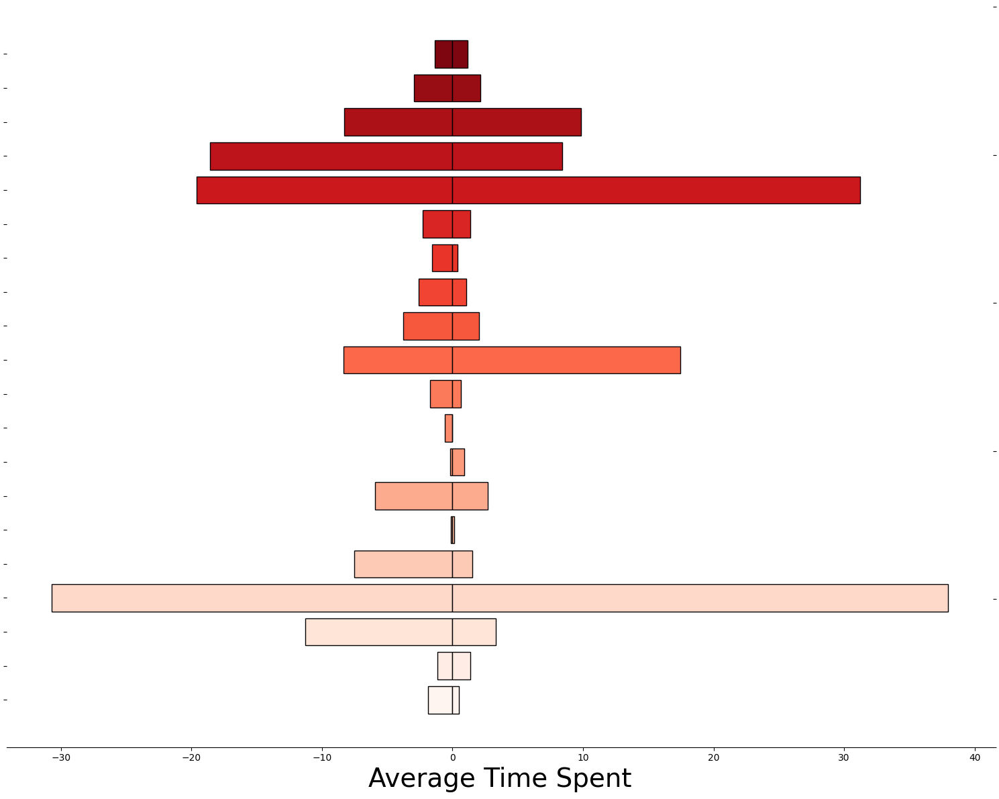

In [205]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

mean_scores_df_og= pd.read_csv('new_csv_with_mean_scores_high.csv')
mean_scores_df_og= mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']



# Assuming df_sorted is your dataframe containing the 'Activity' and 'Average Time Spent' columns
# and mean_scores_df containing the 'Activity' and 'Mean Score' columns.
df_sorted= pd.read_csv("activity_time_intersection_male.csv")
# df_sorted= pd.read_csv("new_csv_with_mean_scores_high.csv")
# mean_scores_df= pd.read_csv('new_csv_with_mean_scores_mid.csv')
mean_scores_df= pd.read_csv('activity_time_intersection_female.csv')



df_sorted= df_sorted[df_sorted['Activity'] != 'work, main job']

# mean_scores_df = mean_scores_df.sort_values(by='WUMEANING', ascending=True)
mean_scores_df= mean_scores_df[mean_scores_df['Activity'] != 'work, main job']



with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Assuming df_sorted is already defined
# Convert the "activity" column to lowercase and strip trailing spaces for comparison
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()

# Filter df_sorted to include only rows where the "activity" is in the unique categories
df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]




common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])

# Filter both dataframes to only include the common tasks
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df_og = mean_scores_df_og.sort_values(by='Mean Score', ascending=True)

merged_df_og = pd.merge(mean_scores_df_og, df_sorted,right_on='Activity', left_on='ATUS Supercategory', how='inner')

merged_df_og = pd.merge(merged_df_og, mean_scores_df,right_on='Activity', left_on='Activity', how='inner')




df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)
mean_scores_df = mean_scores_df.sort_values(by='Average Time Spent', ascending=True)

# Create a gradient color for each bar based on the sorted order
# color_gradient_time = [plt.cm.Reds(i / len(df_sorted['ATUS Supercategory'])) for i in range(len(df_sorted['ATUS Supercategory']))]
# color_gradient_score = [plt.cm.Reds(i / len(mean_scores_df['ATUS Supercategory'])) for i in range(len(mean_scores_df['ATUS Supercategory']))]
color_gradient_time = [plt.cm.Reds(i / len(df_sorted['Activity'])) for i in range(len(df_sorted['Activity']))]
color_gradient_score = [plt.cm.Reds(i / len(mean_scores_df['Activity'])) for i in range(len(mean_scores_df['Activity']))]

color_map = dict(zip(df_sorted['Activity'], color_gradient_time))
bar_colors = merged_df_og['Activity'].map(color_map)

# Start the plot
fig, ax = plt.subplots(figsize=(15, 12))

# Plot the 'Average Time Spent' bars with a label for the legend
bars_time = ax.barh(merged_df_og['Activity'], -merged_df_og['Average Time Spent_x'], color=color_gradient_time, edgecolor='black', label='Average Time Spent')
# bars_time = ax.barh(df_sorted['ATUS Supercategory'], -df_sorted['Mean Score'], color=color_gradient_time, edgecolor='black', label='Desire for Automation')

bars_score = ax.barh(merged_df_og['Activity'], merged_df_og['Average Time Spent_y'], color=color_gradient_score, edgecolor='black', label='Desire for Automation')

# bars_time = ax.barh(df_sorted['ATUS Supercategory'], df_sorted['Mean Score'], color=color_gradient_time, edgecolor='black', label='Average Happiness')

# Overlay the 'Mean Score' bars with a label for the legend
# bars_score = ax.barh(mean_scores_df['ATUS Supercategory'], mean_scores_df['Mean Score'], color=color_gradient_score, edgecolor='black', label='Mean Score')

# ax.set_xlim(-10, 10) 

# Set the y-labels, titles and ticks
ax.set_xlabel('Average Time Spent', fontsize=28)
# ax.set_title('Comparison of Desure of Automation: Mid vs High')

ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=28)
# ax.set_yticklabels([])
# Setting labels for the left y-axis
# ax.set_ylabel('Category')
ax.yaxis.set_label_position("left")

# Secondary y-axis for Mean Score
ax2 = ax.twinx()
# ax2.set_ylabel('ATUS Supercategory')
ax2.yaxis.set_label_position("right")
# ax.set_ylabel('Activities')
# ax2.set_yticks(ax.get_yticks())
# ax2.set_yticklabels(mean_scores_df['ATUS Supercategory'], rotation=0)
ax2.set_yticklabels([])
# Create legends by explicitly defining handles and labels
# handles, labels = ax.get_legend_handles_labels()
# handles2, labels2 = ax2.get_legend_handles_labels()
# ax.legend(handles + handles2, labels + labels2, loc='best')

# ax.text(-5, -1, 'DA', va='bottom', ha='left', fontsize=14)
# ax.text(5, -1, 'Meaningfulness', va='bottom', ha='right', fontsize=14)


# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# ax.spines['left'].set_visible(False)

# ax2.spines['top'].set_visible(False)
# ax2.spines['right'].set_visible(False)
# # ax.spines['bottom'].set_visible(False)
# ax2.spines['left'].set_visible(False)

# Ensure tight layout and show plot
plt.tight_layout()
# plt.savefig("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/DA_H-M_hh.pdf")

In [197]:
merged_df_og

,ATUS Supercategory,Mean Score,Activity Code_x,Average Time Spent_x,Activity,Activity Code_y,Average Time Spent_y
0,food and drink preparation,4.453557,20201,23.073554,food and drink preparation,20201,40.163101
1,food presentation,4.736642,20202,0.112267,food presentation,20202,0.417642
2,"storing interior hh items, inc. food",4.941476,20104,0.980644,"storing interior hh items, inc. food",20104,1.948526
3,household & personal organization and planning,5.057420,20902,5.528672,household & personal organization and planning,20902,8.492733
4,"interior arrangement, decoration, & repairs",5.578790,20301,5.153399,"interior arrangement, decoration, & repairs",20301,2.843359
5,home security,5.666123,20905,0.134043,home security,20905,0.125151
6,care for animals and pets (not veterinary care),5.738866,20601,3.644326,care for animals and pets (not veterinary care),20601,5.350828
7,heating and cooling,5.828519,20303,1.404065,heating and cooling,20303,0.286839
8,"sewing, repairing, & maintaining textiles",5.892863,20103,0.054440,"sewing, repairing, & maintaining textiles",20103,3.941461
9,hh & personal mail & messages (except e-mail),5.918659,20903,0.623034,hh & personal mail & messages (except e-mail),20903,1.591441


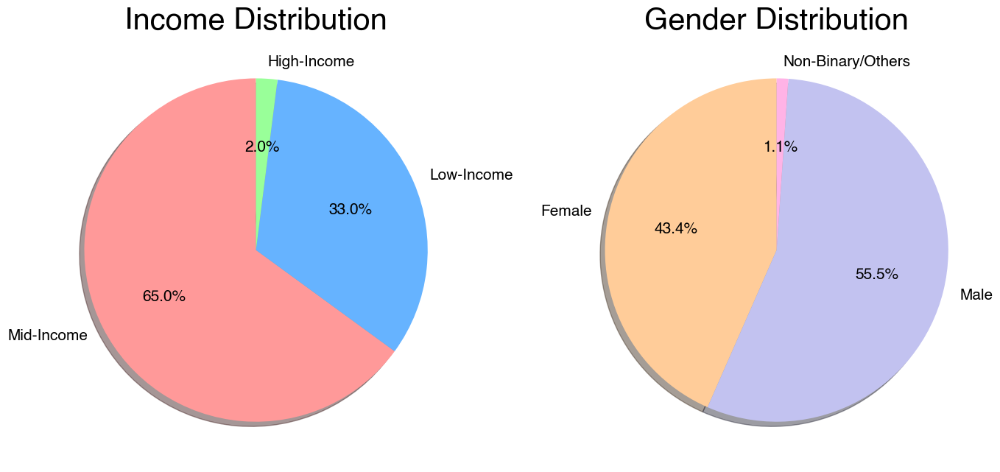

In [11]:
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica'],
    'font.size': 12  # Set font size as needed
})
# Data for income distribution
income_labels = ['Mid-Income', 'Low-Income', 'High-Income']
income_sizes = [64.9, 33.0, 2.0]
# income_sizes = [86.1, 8.9, 5.0]
income_colors = ['#ff9999','#66b3ff','#99ff99']
# income_explode = (0.1, 0, 0)  # only "explode" the 1st slice

# Data for gender distribution
gender_labels = ['Female', 'Male', 'Non-Binary/Others']
gender_sizes = [43.41, 55.50, 1.09]  # Approximated sum to 100%
gender_colors = ['#ffcc99','#c2c2f0','#ffb3e6']

# gender_labels = ['Male', 'Female']
# gender_sizes = [53.8, 46.2]
# gender_colors = ['#ffcc99','#c2c2f0']
# # gender_explode = (0.1, 0, 0.2)  # "explode" 1st and 3rd slices

# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7))
font_size = 15
plt.rcParams.update({'font.size': font_size})

# Income Distribution Pie Chart
axs[0].pie(income_sizes, labels=income_labels, colors=income_colors, 
           autopct='%1.1f%%', shadow=True, startangle=90)
axs[0].set_title('Income Distribution', fontsize=30)

# Gender Distribution Pie Chart
axs[1].pie(gender_sizes, labels=gender_labels, colors=gender_colors, 
           autopct='%1.1f%%', shadow=True, startangle=90)
axs[1].set_title('Gender Distribution', fontsize= 30)

# Adjust layout to make room for the legend
plt.tight_layout()

plt.savefig("plots/plot_gender_B1K.png", format='png', dpi=300, transparent=True)  # You can change the file format and dpi as needed

plt.show()


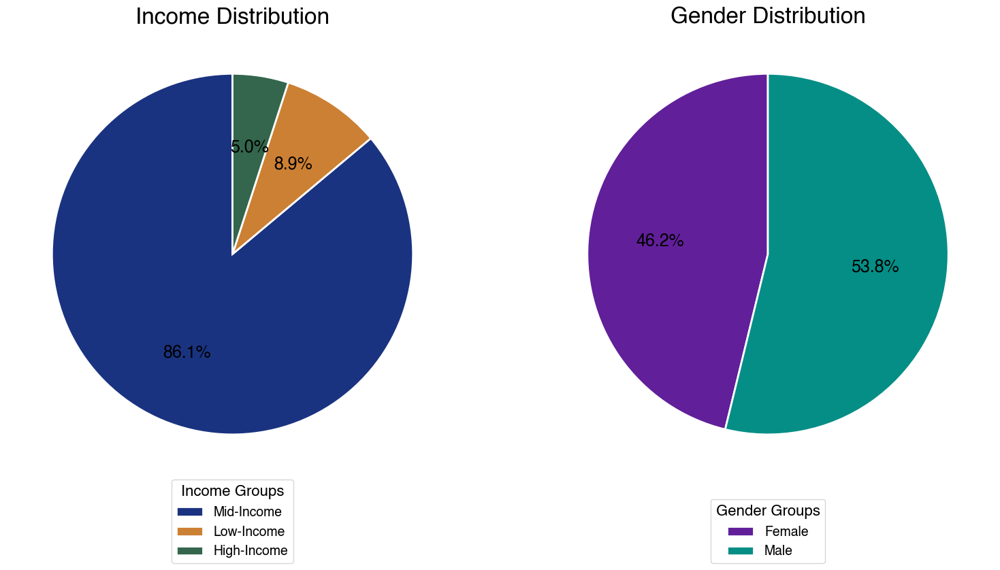

In [208]:
import matplotlib.pyplot as plt

# Update font settings for professional styling
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica'],
    'font.size': 18,  # Larger font size for labels and percentages
    'axes.titlesize': 24,  # Font size for titles
})

# Professional color palette (cool tones, muted)
income_colors = ['#1A3380', '#CC8033', '#33664C']  # Muted blue, orange, teal
gender_colors = ['#611f9a', '#058e86', '#EDC948']  # Muted green, red, yellow

# Data for income distribution
income_labels = ['Mid-Income', 'Low-Income', 'High-Income']
# income_sizes = [64.9, 33.0, 2.0]
income_sizes = [86.1, 8.9, 5.0]


# Data for gender distribution
# gender_labels = ['Female', 'Male', 'Non-Binary/Others']
gender_sizes = [43.41, 55.50, 1.09]  # Approximated sum to 100%

gender_labels = ['Female', 'Male']
gender_sizes = [46.2, 53.8]
gender_colors = ['#611f9a', '#058e86']


# gender_labels = ['Male', 'Female']
# gender_sizes = [53.8, 46.2]
# gender_colors = [ '#058e86', '#611f9a']
# # gender_explode = (0.1, 0, 0.2)  # "explode" 1st and 3rd slices

# Create subplots for side-by-side pie charts
fig, axs = plt.subplots(1, 2, figsize=(16, 8))  # Larger figure size for better clarity

# Income Distribution Pie Chart
income_pie = axs[0].pie(income_sizes, labels=None, colors=income_colors,
                        autopct='%1.1f%%', shadow=False, startangle=90, 
                        wedgeprops={'edgecolor': 'white', 'linewidth': 2})  # Clean white borders for separation
axs[0].set_title('Income Distribution', fontsize=24)

# Gender Distribution Pie Chart
gender_pie = axs[1].pie(gender_sizes, labels=None, colors=gender_colors,
                        autopct='%1.1f%%', shadow=False, startangle=90, 
                        wedgeprops={'edgecolor': 'white', 'linewidth': 2})  # Clean white borders for separation
axs[1].set_title('Gender Distribution', fontsize=24)

# Create legends for both charts and place them at the bottom of the figure
income_legend = axs[0].legend(income_labels, title="Income Groups", loc='lower center', 
                              bbox_to_anchor=(0.5, -0.2), fontsize=14, title_fontsize=16)

gender_legend = axs[1].legend(gender_labels, title="Gender Groups", loc='lower center', 
                              bbox_to_anchor=(0.5, -0.2), fontsize=14, title_fontsize=16)

# Adjust layout for better spacing between the plots and the legend
plt.tight_layout()

# Save the figure to a file with high dpi for publication quality
plt.savefig("plots/plot_gender_ATUS.png", format='png', dpi=300, transparent=True)

# Display the plot
plt.show()


<Figure size 640x480 with 0 Axes>

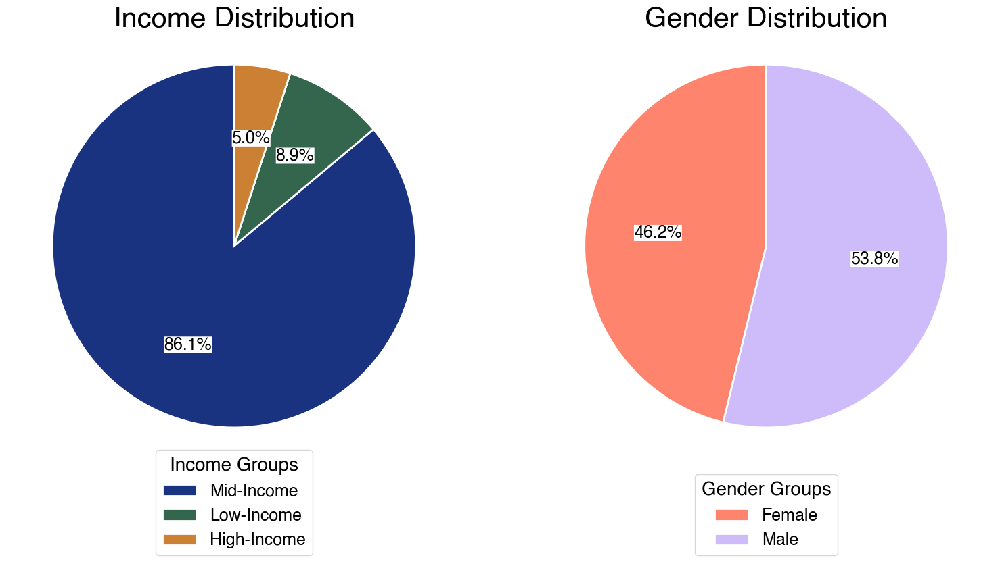

In [246]:
import matplotlib.pyplot as plt

# Update font settings for professional styling
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Helvetica'],
    'font.size': 18,  # Larger font size for labels and percentages
    'axes.titlesize': 24,  # Font size for titles
})
plt.subplots_adjust(bottom=-5) 
# Professional color palette (cool tones, muted)
income_colors = ['#1A3380', '#33664C', '#CC8033']  # Muted blue, orange, teal
gender_colors = ['#ff846d', '#cdbcf9', '#FFD700']  # Muted green, red, yellow

income_labels = ['Mid-Income', 'Low-Income', 'High-Income']
# income_sizes = [64.9, 33.0, 2.0]
income_sizes = [86.1, 8.9, 5.0] #ATUS
income_sizes = [86.1, 8.9, 5.0] #ATUS WB
# income_colors = ['#ff9999','#66b3ff','#99ff99']
# income_explode = (0.1, 0, 0)  # only "explode" the 1st slice

# # Data for gender distribution
# gender_labels = ['Female', 'Male', 'Non-Binary/Others']
# gender_sizes = [43.099, 55.720, 1.18009]  # Approximated sum to 100%

                 
gender_labels = ['Female', 'Male']
# gender_sizes = [46.2, 53.8] # ATUS
gender_sizes = [46.2, 53.8] #ATUS WB
gender_colors = ['#ff846d', '#cdbcf9']

# Create subplots for side-by-side pie charts
fig, axs = plt.subplots(1, 2, figsize=(16, 8))  # Larger figure size for better clarity

# Define the white box style for autopct
autopct_style = lambda p: f'{p:.1f}%' if p > 0 else ''
# plt.subplots_adjust(top=0.2)  # Adjust the top spacing to move the title

# Income Distribution Pie Chart
income_pie = axs[0].pie(income_sizes, labels=None, colors=income_colors,
                        autopct=lambda p: autopct_style(p),
                        shadow=False, startangle=90, 
                        wedgeprops={'edgecolor': 'white', 'linewidth': 2},
                        textprops={'bbox': dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0')})  # White box for percentages
axs[0].set_title('Income Distribution', fontsize=30 , y=0.97)
# axs[0].title.set_position([0.5, 0.5]) 

# Gender Distribution Pie Chart
gender_pie = axs[1].pie(gender_sizes, labels=None, colors=gender_colors,
                        autopct=lambda p: autopct_style(p),
                        shadow=False, startangle=90, 
                        wedgeprops={'edgecolor': 'white', 'linewidth': 2},
                        textprops={'bbox': dict(facecolor='white', edgecolor='none', boxstyle='round,pad=0')})  # White box for percentages
axs[1].set_title('Gender Distribution', fontsize=30 , y=0.97)
# axs[1].title.set_position([0.5, 0.5]) 

# Create legends for both charts and place them at the bottom of the figure
income_legend = axs[0].legend(income_labels, title="Income Groups", loc='lower center', 
                              bbox_to_anchor=(0.5, -0.20), fontsize=18, title_fontsize=20)

gender_legend = axs[1].legend(gender_labels, title="Gender Groups", loc='lower center', 
                              bbox_to_anchor=(0.5, -0.20), fontsize=18, title_fontsize=20)

# Adjust layout for better spacing between the plots and the legend
plt.tight_layout()

# Save the figure to a file with high dpi for publication quality
plt.savefig("plots/plot_gender_ATUS.png", bbox_inches='tight', format='png', dpi=300, transparent=True)

# Display the plot
plt.show()


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_57594/3367963111.py:59: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=20)


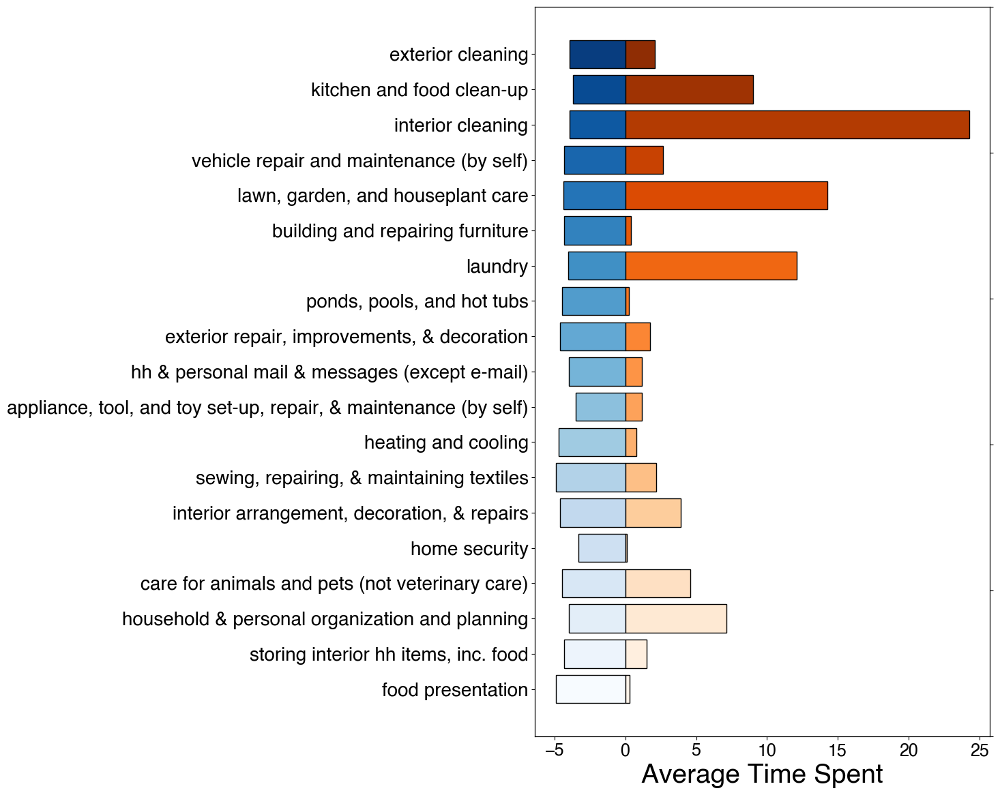

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import json

# Load the original dataframes
mean_scores_df_og = pd.read_csv('new_csv_with_mean_scores.csv')
mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']

df_sorted = pd.read_csv("activity_time_intersection.csv")
mean_scores_df = pd.read_csv('/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/subset_final_data_new_GP.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# Load unique categories and clean them
with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Clean and filter dataframes based on unique categories
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]

common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df_og = mean_scores_df_og.sort_values(by='Mean Score', ascending=True)

# Merge the dataframes for comparison
merged_df_og = pd.merge(mean_scores_df_og, df_sorted, right_on='Activity', left_on='ATUS Supercategory', how='inner')
merged_df_og = pd.merge(merged_df_og, mean_scores_df, right_on='Activity', left_on='Activity', how='inner')

# Sort for plotting
df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)
mean_scores_df = mean_scores_df.sort_values(by='WUHAPPY', ascending=True)

# Generate color gradients
color_gradient_time = [plt.cm.Blues(i / len(df_sorted['Activity'])) for i in range(len(df_sorted['Activity']))]
color_gradient_score = [plt.cm.Oranges(i / len(mean_scores_df['Activity'])) for i in range(len(mean_scores_df['Activity']))]

# Create color mapping for the activities
color_map = dict(zip(df_sorted['Activity'], color_gradient_time))
bar_colors = merged_df_og['Activity'].map(color_map)

# Plotting
fig, ax = plt.subplots(figsize=(15, 12))

# Plot the 'Average Time Spent' and 'Mean Score' bars
bars_time = ax.barh(merged_df_og['Activity'], -merged_df_og['WUHAPPY'], color=color_gradient_time, edgecolor='black', label='Average Time Spent')
bars_score = ax.barh(merged_df_og['Activity'], merged_df_og['Average Time Spent'], color=color_gradient_score, edgecolor='black', label='Desire for Automation')

# Labeling and axis formatting
ax.set_xlabel('Average Time Spent', fontsize=28)
ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=20)
ax.yaxis.set_label_position("left")

# Secondary y-axis for Mean Score
ax2 = ax.twinx()
ax2.set_yticklabels([])

# Tight layout and display
plt.tight_layout()
plt.show()


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_859/1689494949.py:77: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=20)


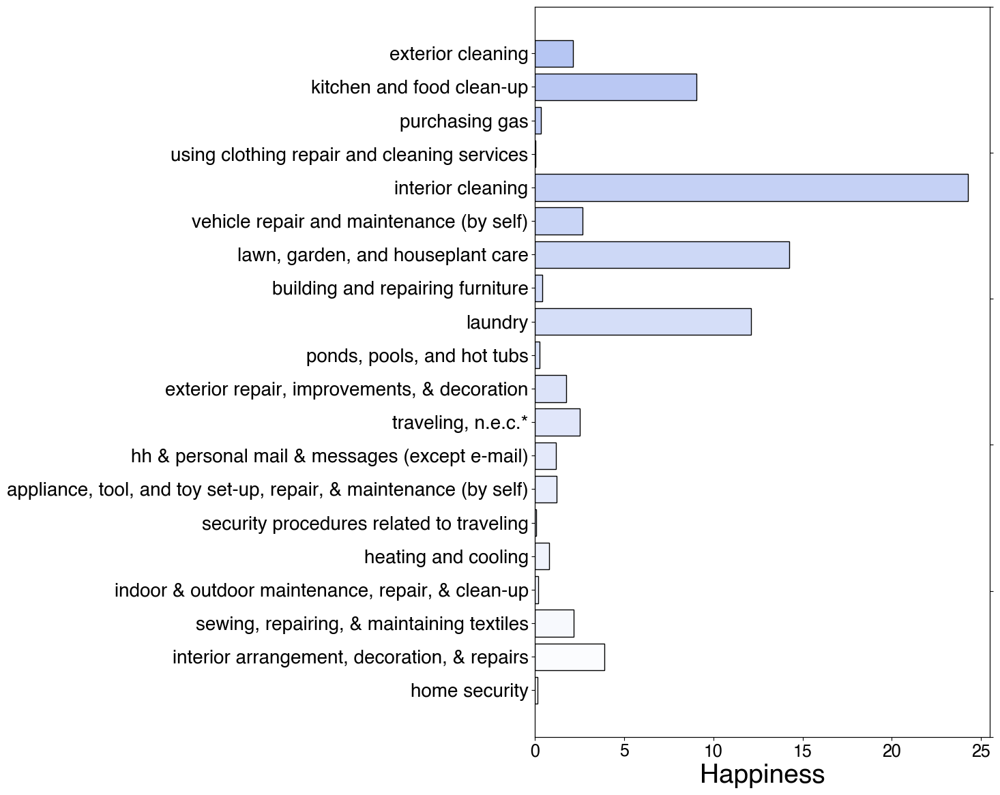

In [247]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import json

e="WUPAIN"
# Load the original dataframes
mean_scores_df_og = pd.read_csv('new_csv_with_mean_scores.csv')
mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']
mean_scores_df_og = mean_scores_df_og.sort_values(by="Mean Score", ascending=False)
mean_scores_df_og = mean_scores_df_og [:20]

df_sorted = pd.read_csv("activity_time_intersection.csv")
mean_scores_df = pd.read_csv('/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/subset_final_data_new_GP.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# Load unique categories and clean them
with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Clean and filter dataframes based on unique categories
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
# df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]

common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df_og = mean_scores_df_og.sort_values(by='Mean Score', ascending=True)

# Merge the dataframes for comparison
merged_df_og = pd.merge(mean_scores_df_og, df_sorted, right_on='Activity', left_on='ATUS Supercategory', how='inner')
merged_df_og = pd.merge(merged_df_og, mean_scores_df, right_on='Activity', left_on='Activity', how='inner')

# Sort for plotting
df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)
mean_scores_df = mean_scores_df.sort_values(by=e, ascending=True)

# Custom colors
# magenta = (0.0, 0.5, 0.5)  # RGB for teal
# magenta = (1.0, 0.0, 1.0)  # RGB for magenta magenta
# magenta= (0.13, 0.55, 0.13) # forestgreen
# magenta = (0.85, 0.65, 0.13) # goldenrod
# magenta = (0.86, 0.08, 0.24) # crimson
magenta = (0.25, 0.41, 0.88) #royalblue
# magenta = (0.8, 0.33, 0.0) #orange



# Generate reversed color gradients: starting from transparent (alpha=0) and going to fully opaque (alpha=1)
n_activities = len(df_sorted['Activity'])
color_gradient_time = [(magenta[0], magenta[1], magenta[2], i / (n_activities - 1)) for i in range(n_activities)]  # Increasing alpha
color_gradient_score = [(magenta[0], magenta[1], magenta[2], i / (n_activities - 1)) for i in range(n_activities)]  # Increasing alpha

# Create color mapping for the activities
color_map_time = dict(zip(df_sorted['Activity'], color_gradient_score))
bar_colors_time = merged_df_og['Activity'].map(color_map_time)

color_map_score = dict(zip(mean_scores_df['Activity'], color_gradient_score))
bar_colors_score = merged_df_og['Activity'].map(color_map_score)

# Plotting
fig, ax = plt.subplots(figsize=(15, 12))

# Plot the 'Average Time Spent' and 'Mean Score' bars
# bars_time = ax.barh(merged_df_og['Activity'], merged_df_og[e], color=color_gradient_time, edgecolor='black', label='Average Time Spent')
bars_score = ax.barh(merged_df_og['Activity'], merged_df_og['Average Time Spent'], color=color_gradient_score, edgecolor='black', label='Desire for Automation')

# Labeling and axis formatting
ax.set_xlabel('Happiness', fontsize=28)
ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=20)
ax.yaxis.set_label_position("left")

# Secondary y-axis for Mean Score
ax2 = ax.twinx()
ax2.set_yticklabels([])

# Tight layout and display
plt.tight_layout()
# plt.savefig("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/plot_HH_WUSTRESS.png", format='png', dpi=300, transparent=True)

plt.show()


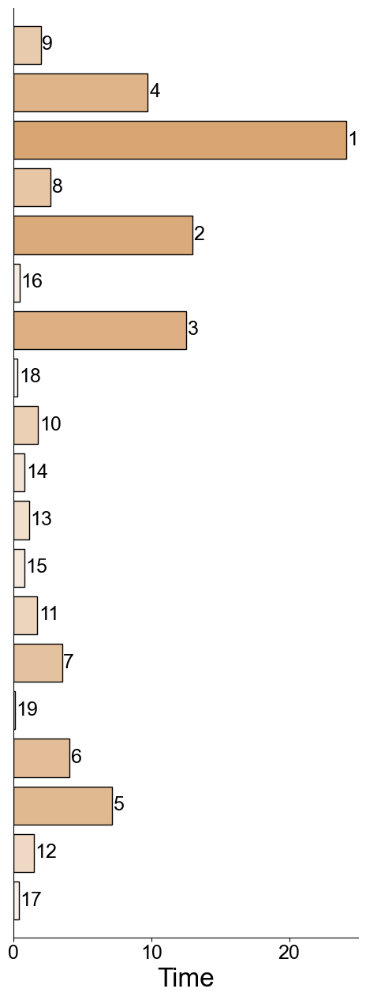

In [685]:
import matplotlib.pyplot as plt
import pandas as pd
import json

# emotion = "WUPAIN"
# x="male"

# Load the original dataframes
mean_scores_df_og = pd.read_csv(f'new_csv_with_mean_scores.csv')
mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']

df_sorted = pd.read_csv(f"activity_time_intersection_GP.csv")
mean_scores_df = pd.read_csv(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/subset_final_data_new.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# # Load unique categories and clean them
# with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:
#     unique_categories = json.load(fp)

# # Convert the list of unique categories to lowercase and strip trailing spaces
# unique_categories = [cat.lower().strip() for cat in unique_categories]

# Clean and filter dataframes based on unique categories

df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
mean_scores_df["Activity"] = mean_scores_df["Activity"].str.lower().str.strip()
df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]

common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df_og = mean_scores_df_og.sort_values(by='Mean Score', ascending=True)

# Merge the dataframes for comparison
merged_df_og = pd.merge(mean_scores_df_og, df_sorted, right_on='Activity', left_on='ATUS Supercategory', how='inner')
merged_df_og = pd.merge(merged_df_og, mean_scores_df, right_on='Activity', left_on='Activity', how='inner')

# Sort for plotting
df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)
# mean_scores_df = mean_scores_df.sort_values(by=emotion, ascending=True)

# Calculate the ranks for stress (descending order, highest stress is Rank 1)
merged_df_og['Stress Rank'] = merged_df_og["Average Time Spent"].rank(ascending=False).astype(int)
# merged_df_og['Stress Rank'] = merged_df_og[emotion].rank(ascending=False).astype(int)

# Custom color for the base
# Custom colors
# magenta = (0.0, 0.5, 0.5)  # RGB for teal
# magenta = (1.0, 0.0, 1.0)  # RGB for magenta magenta
# magenta= (0.13, 0.55, 0.13) # forestgreen --MAIN
# magenta = (0.85, 0.65, 0.13) # goldenrod
# magenta = (0.86, 0.08, 0.24) # crimson
# magenta = (0.25, 0.41, 0.88) #royalblue
# magenta = (0.8, 0.33, 0.4) #orange
# magenta = (0.55, 0.0, 0.55) #– Dark Purple

# magenta = (0.6, 1.0, 1.0)          # Pastel Teal
# magenta = (1.0, 0.6, 1.0)       # Pastel Magenta
# magenta = (0.6, 0.8, 0.6)   # Pastel Forest Green
# magenta = (1.0, 0.85, 0.55)    # Pastel Goldenrod
# magenta = (1.0, 0.4, 0.5)        # Pastel Crimson
# magenta = (0.7, 0.8, 1.0)      # Pastel Royal Blue
# magenta = (1.0, 0.8, 0.6)         # Pastel Orange
# magenta = (1.0, 0.78, 0.59) #orange new
magenta= (0.85,0.65,0.45) # Brown time

# Generate color gradient based on rank (Rank 1 = darkest)
n_ranks = merged_df_og['Stress Rank'].nunique()
color_gradient_score = [(magenta[0], magenta[1], magenta[2], 1 - (rank - 1) / (n_ranks)) for rank in range(1, n_ranks + 5)]

# Map the color based on the rank
color_map_score = dict(zip(range(1, n_ranks + 1), color_gradient_score))
bar_colors_score = merged_df_og['Stress Rank'].map(color_map_score)

# Plotting
# fig, ax = plt.subplots(figsize=(15, 12))

# # Plot the 'Average Time Spent' bars with colors based on rank
# bars_score = ax.barh(merged_df_og['Activity'], merged_df_og['Average Time Spent'], color=bar_colors_score, edgecolor='black', label='Average Time Spent')
# bars_score = ax.barh(merged_df_og['Activity'], merged_df_og[emotion], color=bar_colors_score, edgecolor='black', label=emotion)

# # Labeling and axis formatting
# ax2.set_xlabel('Tiredness', fontsize=28)
# # ax.set_xlabel('Sadness', fontsize=28)
# ax.set_yticklabels(merged_df_og['Activity'], rotation=10, fontsize=24)
# ax.yaxis.set_label_position("left")

# # Annotate ranks next to the bars
# for i, rank in enumerate(merged_df_og['Stress Rank']):
#     # ax.text(merged_df_og['Average Time Spent'].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')
#     ax.text(merged_df_og[emotion].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')

# # Remove the top and right spines (borders)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# # Secondary y-axis for Mean Score
# ax2 = ax.twinx()
# # ax2.set_yticklabels([])

# # Tight layout and display
# # plt.tight_layout()
# # plt.show()

# # plotting
fig, ax = plt.subplots(figsize=(5, 13))
# fig, ax = plt.subplots(figsize=(5, 29))
# ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=18)
# Plot the 'Average Time Spent' bars
bars_time = ax.barh(merged_df_og['Activity'], merged_df_og["Average Time Spent"], color=bar_colors_score, edgecolor='black', label='Average Time Spent')
# bars_time = ax.barh(merged_df_og['Activity'], merged_df_og[emotion], color=bar_colors_score, edgecolor='black', label=emotion)

# Labeling and axis formatting
ax.set_xlabel('Time', fontsize=24)

ax.set_xticks(range(0,31,10))
ax.yaxis.label.set_size(24)
ax.set_xlim([0, 25])

# ax.set_xlim(0, 6)  # Set x-axis range from 0 to 6
# ax.set_xticks(range(7))
# Remove y-axis tick labels (categories on the left)
ax.set_yticklabels([])

# Remove the top and right spines (borders)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Ensure that ticks on the y-axis are also removed
ax.tick_params(left=False)  # Hide y-axis ticks

# Annotate the bars with the stress rank
for i, (activity, rank) in enumerate(zip(merged_df_og['Activity'], merged_df_og['Stress Rank'])):
    ax.text(merged_df_og["Average Time Spent"].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')
    # ax.text(merged_df_og[emotion].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')

# Secondary y-axis for Mean Score
# ax2 = ax.twinx()
# ax2.set_yticklabels([])

# ax.set_ylabel('Activities', fontsize=24)
ax.margins(y=0.02) 

# # Remove the top and right spines for ax2 as well
# ax.yaxis.label.set_size(24)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Additional step to remove borders, if necessary
for spine in ['top', 'right']:
    ax.spines[spine].set_color('none')
    ax2.spines[spine].set_color('none')

# Tight layout and display
plt.tight_layout()
# plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/plot_HH_{emotion}_with_ranks.pdf", format='pdf', dpi=300, transparent=True)
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/HH/plot_Time_with_ranks.pdf", format='pdf', dpi=300, transparent=True)

plt.show()


In [30]:
if merged_df_og['Stress Rank'].isna().any():
    print("There are NaN values in the 'Stress Rank' column!")

/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_1059/827001406.py:130: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(wrapped_activity_labels, rotation=0, fontsize=20, linespacing=0.8)


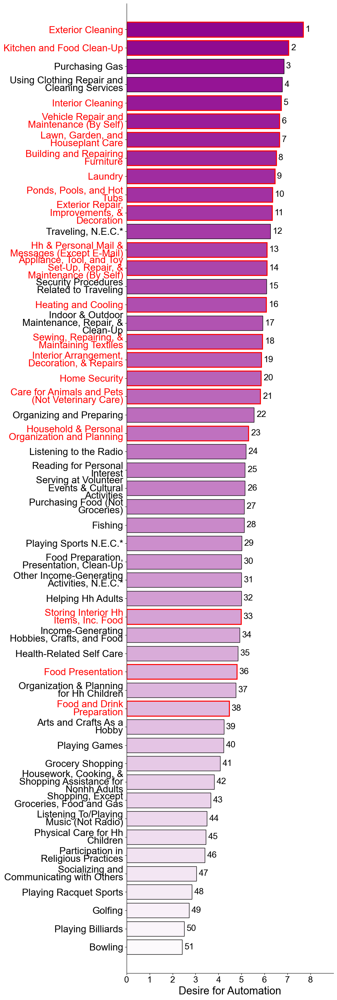

In [348]:
import matplotlib.pyplot as plt
import pandas as pd
import json
import textwrap

plt.rcParams.update({
    'font.family': 'Arial',
    # 'font.sans-serif': ['Helvetica'],
    'font.size': 18,  # Larger font size for labels and percentages
    'axes.titlesize': 24,  # Font size for titles
})
emotion = "Mean Score"
x="GP"
# Load the original dataframes
mean_scores_df_og = pd.read_csv(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/new_csv_with_mean_scores.csv')
mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']

df_sorted = pd.read_csv(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/activity_time_intersection_{x}.csv")
mean_scores_df = pd.read_csv(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/subset_final_data_new_{x}.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# # Load unique categories and clean them
# with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:
#     unique_categories = json.load(fp)

# # Convert the list of unique categories to lowercase and strip trailing spaces
# unique_categories = [cat.lower().strip() for cat in unique_categories]

# Clean and filter dataframes based on unique categories
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
mean_scores_df["Activity"] = mean_scores_df["Activity"].str.lower().str.strip()
# df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]

common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df_og = mean_scores_df_og.sort_values(by='Mean Score', ascending=True)

# Merge the dataframes for comparison
merged_df_og = pd.merge(mean_scores_df_og, df_sorted, right_on='Activity', left_on='ATUS Supercategory', how='inner')
merged_df_og = pd.merge(merged_df_og, mean_scores_df, right_on='Activity', left_on='Activity', how='inner')

# Sort for plotting
df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)

# Calculate the ranks for stress (descending order, highest stress is Rank 1)
merged_df_og['Stress Rank'] = merged_df_og[emotion].rank(ascending=False).astype(int)

# Custom color for the base
# magenta = (1.0, 0.78, 0.59) #orange
# magenta= (0.82, 0.76, 1.0)  #purple
# magenta=(0.65,0.60,0.80)
magenta = (0.55, 0.0, 0.55) #– Dark Purple


# Generate color gradient based on rank (Rank 1 = darkest)
# n_ranks = merged_df_og['Stress Rank'].nunique()
n_ranks = len(merged_df_og['Stress Rank'])
# color_gradient_score = [(magenta[0], magenta[1], magenta[2], 1 - (rank - 1) / (n_ranks - 1)) for rank in range(1, n_ranks + 10)]
color_gradient_score = [(magenta[0], magenta[1], magenta[2], 1 - (rank - 1) / (n_ranks+1)) for rank in range(1, n_ranks + 10)]

# Map the color based on the rank
color_map_score = dict(zip(range(0, n_ranks + 1), color_gradient_score))
bar_colors_score = merged_df_og['Stress Rank'].map(color_map_score)

# Define a function to wrap text
# def wrap_labels(labels, max_lines=3):
#     wrapped_labels = []
#     for label in labels:
#         wrapped = textwrap.wrap(label.title(), width=25)  # Adjust width as needed
#         wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
#     return wrapped_labels

def wrap_labels(labels, max_lines=3):
    articles = {'a', 'an', 'the', 'and', 'but', 'or', 'for', 'nor', 'on', 'at', 'to', 'by', 'with', 'in', 'of'}  # Set of articles and conjunctions to exclude
    wrapped_labels = []

    for label in labels:
        words = label.split()  # Split label into words
        title_cased_words = [
            word.title() if word.lower() not in articles else word.lower()
            for word in words
        ]
        # Ensure the first word is always capitalized (even if it's an article)
        title_cased_words[0] = title_cased_words[0].title()
        
        # Join the words back into a single string
        title_cased_label = ' '.join(title_cased_words)
        
        # Wrap the text
        wrapped = textwrap.wrap(title_cased_label, width=25)  # Adjust the width as needed
        wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines

    return wrapped_labels



# Wrap the y-axis labels
wrapped_labels = wrap_labels(merged_df_og['Activity'])

# Plotting
# fig, ax = plt.subplots(figsize=(10, 13))

# fig, ax = plt.subplots(figsize=(9, 13))

fig, ax = plt.subplots(figsize=(10, 29))

# Plot the bars
# bars_time = ax.barh(wrapped_labels, merged_df_og[emotion], color=bar_colors_score, edgecolor='black', label=emotion)
bars_time = ax.barh(merged_df_og['Activity'], merged_df_og[emotion], color=bar_colors_score, edgecolor='black', label=emotion)

# Labeling and axis formatting
ax.set_xlabel('Desire for Automation', fontsize=22)
            #   labelpad=10, loc='left')

# ax.set_ylabel('Activities', fontsize=24, labelpad=40)
# ax.set_ylabel('Activities', fontsize=24)
ax.margins(y=0.02) 

# ax.set_xlim(0, 10)
ax.set_xticks(range(9))
ax.yaxis.label.set_size(24)
ax.set_xlim([0, 9])  # Customize based on what part you want to crop

wrapped_activity_labels = wrap_labels(merged_df_og['Activity'].tolist())
ax.set_yticklabels(wrapped_activity_labels, rotation=0, fontsize=20, linespacing=0.8)

# ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=21, fontweight='bold')

# Remove the top and right spines (borders)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Annotate the bars with the stress rank
for i, rank in enumerate(merged_df_og['Stress Rank']):
    ax.text(merged_df_og[emotion].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')




xtick_labels = ax.get_yticklabels()

# Apply color to the labels that are in the unique categories (household categories)
for tick, label in zip(xtick_labels, merged_df_og['Activity']):
# for tick, label in zip(xtick_labels, df['Activity']):
    if label in unique_categories:
        tick.set_color('red')

import matplotlib.patches as patches


# Adding a red rectangle (bow effect) around the bars in the plot
for i, label in enumerate(merged_df_og['Activity']):
# for i, label in enumerate(df['Activity']):
    if label in unique_categories:
        # Get the x and y position of the bar
        bar = ax.patches[i]
        # Create a red rectangle around the corresponding bar
        rect = patches.Rectangle((bar.get_x(), bar.get_y()), bar.get_width(), bar.get_height(), 
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)  # Add the red rectangle to the plot





# Tight layout and display
plt.tight_layout()

from matplotlib.transforms import Bbox
# bbox = Bbox([[0.0, 0.0], [8.35, 13]])
bbox = Bbox([[0.0, 0.0], [9.4, 29]])
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/{x}/new/plot_{emotion}_with_ranks.pdf", format='pdf', dpi=300,  bbox_inches=bbox,pad_inches=0, transparent=True)

plt.show()


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_859/3203389031.py:42: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


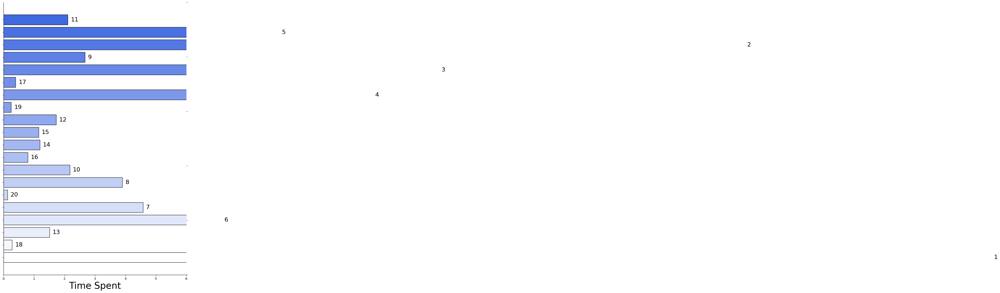

In [49]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 15))

# Plot the 'Average Time Spent' and 'Mean Score' bars
bars_time = ax.barh(merged_df_og['Activity'], merged_df_og["Average Time Spent"], color=color_gradient_time, edgecolor='black', label='Average Time Spent')

# Labeling and axis formatting
ax.set_xlabel('Time Spent', fontsize=28)
ax.set_xlim(0, 6)  # Set x-axis range from 0 to 6

# Remove y-axis tick labels (categories on the left)
ax.set_yticklabels([])

# Remove the top and right spines (borders)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Ensure that ticks on the y-axis are also removed
ax.tick_params(left=False)  # Hide y-axis ticks

# Calculate the ranks for stress (descending order, highest stress is Rank 1)
merged_df_og['Stress Rank'] = merged_df_og["Average Time Spent"].rank(ascending=False).astype(int)

# Annotate the bars with the stress rank
for i, (activity, rank) in enumerate(zip(merged_df_og['Activity'], merged_df_og['Stress Rank'])):
    ax.text(merged_df_og["Average Time Spent"].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')

# Secondary y-axis for Mean Score
ax2 = ax.twinx()
ax2.set_yticklabels([])

# Remove the top and right spines for ax2 as well
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Additional step to remove borders, if necessary
for spine in ['top', 'right']:
    ax.spines[spine].set_color('none')
    ax2.spines[spine].set_color('none')

# Tight layout and display
plt.tight_layout()
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/plot_HH_Average Time Spent_with_ranks.png", format='png', dpi=300, transparent=True)

plt.show()


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_1059/735793622.py:105: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(wrapped_labels, rotation=0, fontsize=22, linespacing=0.9, weight=500)


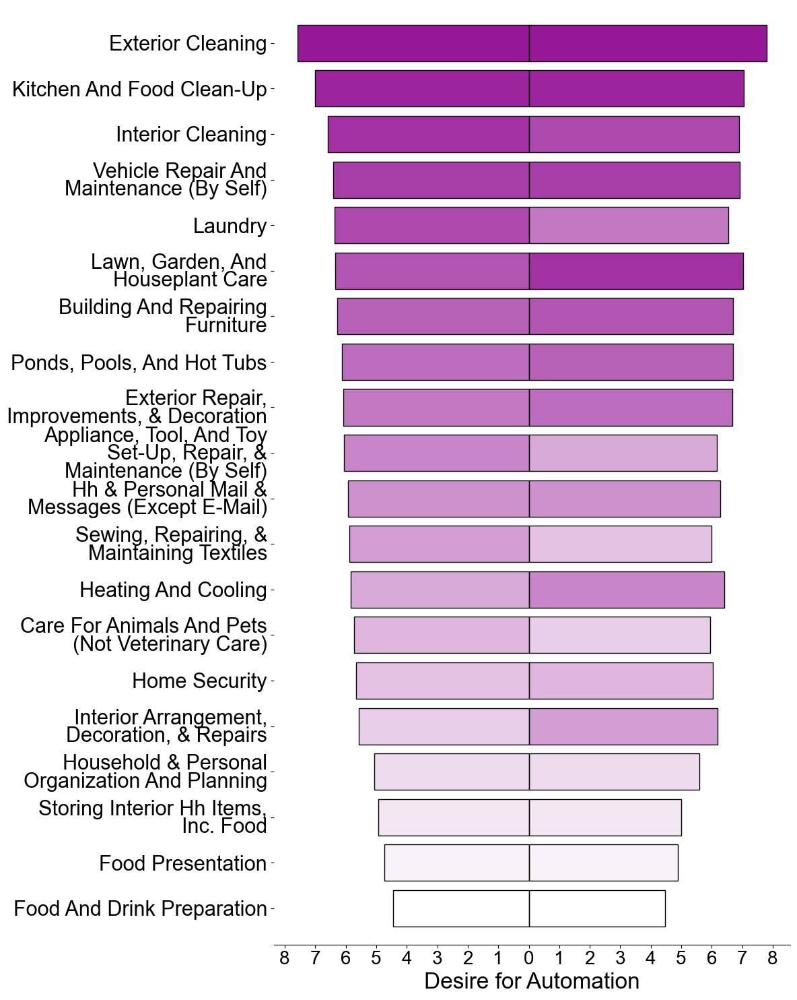

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import textwrap




x="female"

# Assuming df_sorted and mean_scores_df are your dataframes containing 'ATUS Supercategory' and 'Mean Score' columns.
df_sorted = pd.read_csv(f"new_csv_with_mean_scores_male.csv")
mean_scores_df = pd.read_csv(f'new_csv_with_mean_scores_{x}.csv')

df_sorted = df_sorted[df_sorted['ATUS Supercategory'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'] != 'work, main job']

# Load unique categories from a JSON file
with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Prepare data
df_sorted["ATUS Supercategory"] = df_sorted["ATUS Supercategory"].str.lower().str.strip()
mean_scores_df["ATUS Supercategory"] = mean_scores_df["ATUS Supercategory"].str.lower().str.strip()
df_sorted = df_sorted[df_sorted["ATUS Supercategory"].isin(unique_categories)]
common_tasks = set(df_sorted['ATUS Supercategory']) & set(mean_scores_df['ATUS Supercategory'])
df_sorted = df_sorted[df_sorted['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['ATUS Supercategory'].isin(common_tasks)]

df_sorted = df_sorted.sort_values(by='Mean Score', ascending=True)
mean_scores_df = mean_scores_df.sort_values(by='Mean Score', ascending=True)

# Create ranks for 'Mean Score'
df_sorted['Mean Score Rank'] = df_sorted['Mean Score'].rank(method='first')
mean_scores_df['Mean Score Rank'] = mean_scores_df['Mean Score'].rank(method='first')

# Define the color gradient for light blue and magenta
n_ranks = len(df_sorted)  # Number of unique activities


# light_blue = (0.0, 0.56, 0.93) # RGB for light blue
light_blue= (0.55, 0.0, 0.55)

# Create the gradient for scores (magenta gradient)
color_gradient_score = [
    (light_blue[0], light_blue[1], light_blue[2],  (rank - 1) / (n_ranks + 1))
    for rank in range(1, n_ranks + 1)
]

# Create the gradient for time (light blue gradient)
color_gradient_time = [
    (light_blue[0], light_blue[1], light_blue[2],  (rank - 1) / (n_ranks + 1))
    for rank in range(1, n_ranks + 1)
]

# Map the color based on the rank
color_map_score = dict(zip(range(1, n_ranks + 1), color_gradient_score))
bar_colors_score = df_sorted['Mean Score Rank'].map(color_map_score)

# Function to wrap labels
# def wrap_labels(labels, max_lines=2):
#     wrapped_labels = []
#     for label in labels:
#         wrapped = textwrap.wrap(label, width=30)  # Adjust width as needed
#         wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
#     return wrapped_labels

def wrap_labels(labels, max_lines=3):
    wrapped_labels = []
    for label in labels:
        # wrapped = textwrap.wrap(label, width=30)  # Adjust width as needed
        wrapped = textwrap.wrap(label.title(), width=26)
        wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
    return wrapped_labels

# Start the plot

# fig, ax = plt.subplots(figsize=(14, 13 ))

fig, ax = plt.subplots(figsize=(12, 15))

plt.rcParams.update({
    'font.family': 'Arial',
    # 'font.sans-serif': ['Helvetica'],
    'font.size': 12 ,
    # 'font.weight': 500 # Set font size as needed
})


# plt.rcParams['font.family'] = 'Helvetica'
# plt.rcParams['font.weight'] = 'bold'


# fig, ax = plt.subplots(figsize=(14, 29))

# Plot the bars
bars_time = ax.barh(df_sorted['ATUS Supercategory'], -df_sorted['Mean Score'], color=color_gradient_time, edgecolor='black', label='Desire for Automation (Low Income)')
bars_score = ax.barh(mean_scores_df['ATUS Supercategory'], mean_scores_df['Mean Score'], color=color_gradient_score, edgecolor='black', label='Desire for Automation (High Income)')

# Apply label wrapping to y-ticks
wrapped_labels = wrap_labels(df_sorted['ATUS Supercategory'])
ax.set_yticklabels(wrapped_labels, rotation=0, fontsize=22, linespacing=0.9, weight=500)

# Set x-axis ticks: -10 to 10
ax.set_xticks(range(-8, 9))  # Creates x-ticks from -10 to 10
custom_labels = [f'{abs(x)}' if x > 0 else ('0' if x == 0 else f'{abs(x)}') for x in range(-8, 9)]
ax.set_xticklabels(custom_labels, fontsize=20,fontweight=500)

for tick in ax.get_xticklabels():
    tick.set_fontsize(16)
    # tick.set_fontweight('bold')  # Force the tick labels to be bold
    # tick.set_ha('center')
    # tick.set_va('top')

ax.set_xlabel('Desire for Automation', fontsize=24, fontweight=500)
ax.tick_params(axis='x', labelsize=20)
ax.margins(y=0.02) 
# Remove spines (top and right)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# Secondary y-axis for Mean Score (optional, you can remove it if not needed)
# ax2 = ax.twinx()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(False)

# ax2.spines['top'].set_visible(False)
# ax2.spines['right'].set_visible(False)
# # ax.spines['bottom'].set_visible(False)
# ax2.spines['left'].set_visible(False)

# Ensure tight layout and show plot
plt.tight_layout()
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/plot_Mvs{x}_DA.pdf", format='pdf', dpi=300, transparent=True)

# plt.show()


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_10114/1562991194.py:77: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(wrapped_labels, rotation=0, fontsize=18)


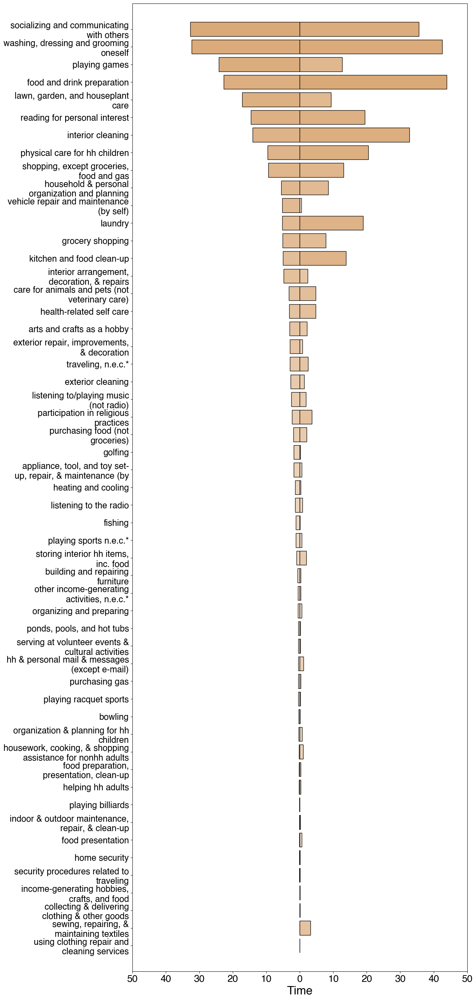

In [489]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import textwrap

x="female"

# Assuming df_sorted and mean_scores_df are your dataframes containing 'ATUS Supercategory' and 'Mean Score' columns.
df_sorted = pd.read_csv(f"activity_time_intersection_male.csv")
mean_scores_df = pd.read_csv(f'activity_time_intersection_{x}.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# Load unique categories from a JSON file
with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Prepare data
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
mean_scores_df["Activity"] = mean_scores_df["Activity"].str.lower().str.strip()
# df_sorted = df_sorted[df_sorted["ATUS Supercategory"].isin(unique_categories)]
common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)
mean_scores_df = mean_scores_df.sort_values(by='Average Time Spent', ascending=True)

# Create ranks for 'Mean Score'
df_sorted['Mean Score Rank'] = df_sorted['Average Time Spent'].rank(method='first')
mean_scores_df['Mean Score Rank'] = mean_scores_df['Average Time Spent'].rank(method='first')

# Define the color gradient for light blue and magenta
n_ranks = len(df_sorted)  # Number of unique activities


# light_blue = (0.0, 0.56, 0.93) # RGB for light blue
brown= (0.85,0.65,0.45) # Brown time

# Create the gradient for scores (magenta gradient)
color_gradient_score = [
    (brown[0], brown[1], brown[2],  (rank - 1) / (n_ranks + 1))
    for rank in range(1, n_ranks + 1)
]

# Create the gradient for time (light blue gradient)
color_gradient_time = [
    (brown[0], brown[1], brown[2],  (rank - 1) / (n_ranks + 1))
    for rank in range(1, n_ranks + 1)
]

# Map the color based on the rank
color_map_score = dict(zip(range(1, n_ranks + 1), color_gradient_score))
bar_colors_score = df_sorted['Mean Score Rank'].map(color_map_score)

# Function to wrap labels
def wrap_labels(labels, max_lines=2):
    wrapped_labels = []
    for label in labels:
        wrapped = textwrap.wrap(label, width=30)  # Adjust width as needed
        wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
    return wrapped_labels

# Start the plot
fig, ax = plt.subplots(figsize=(14, 29))

# Plot the bars
bars_time = ax.barh(df_sorted['Activity'], -df_sorted['Average Time Spent'], color=color_gradient_time, edgecolor='black', label='Desire for Automation (Low Income)')
bars_score = ax.barh(mean_scores_df['Activity'], mean_scores_df['Average Time Spent'], color=color_gradient_score, edgecolor='black', label='Desire for Automation (High Income)')

# Apply label wrapping to y-ticks
wrapped_labels = wrap_labels(df_sorted['Activity'])
ax.set_yticklabels(wrapped_labels, rotation=0, fontsize=18)

# Set x-axis ticks: -10 to 10

ax.set_xticks(range(-50, 51,10))  # Creates x-ticks from -10 to 10
custom_labels = [f'{abs(x)}' if x > 0 else ('0' if x == 0 else f'{abs(x)}') for x in range(-50, 51, 10)]
ax.set_xticklabels(custom_labels, fontsize=20)

ax.set_xlabel('Time', fontsize=24)
ax.tick_params(axis='x', labelsize=20)
ax.margins(y=0.02) 
# Remove spines (top and right)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# Secondary y-axis for Mean Score (optional, you can remove it if not needed)
# ax2 = ax.twinx()

# Ensure tight layout and show plot
plt.tight_layout()
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/GPvsX/plot_Mvs{x}_Time.pdf", format='pdf', dpi=300, transparent=True)

plt.show()


/var/folders/7b/w2c_xdts2nd4b407r_j90r9h0000gn/T/ipykernel_10114/2127369123.py:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(wrapped_labels, rotation=0, fontsize=18)


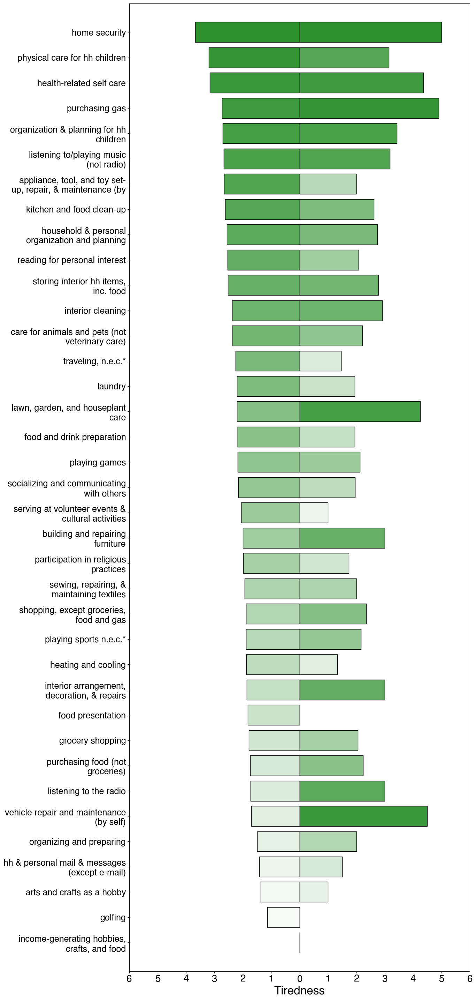

In [204]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import textwrap

x="low"
emotion="WUTIRED"
label="Tiredness"

# Assuming df_sorted and mean_scores_df are your dataframes containing 'ATUS Supercategory' and 'Mean Score' columns.
df_sorted = pd.read_csv(f"subset_final_data_new_GP.csv")
mean_scores_df = pd.read_csv(f'subset_final_data_new_{x}.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# Load unique categories from a JSON file
with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:  
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Prepare data
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
mean_scores_df["Activity"] = mean_scores_df["Activity"].str.lower().str.strip()
# df_sorted = df_sorted[df_sorted["ATUS Supercategory"].isin(unique_categories)]
common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

df_sorted = df_sorted.sort_values(by=emotion, ascending=True)
mean_scores_df = mean_scores_df.sort_values(by=emotion, ascending=True)

# Create ranks for 'Mean Score'
df_sorted['Mean Score Rank'] = df_sorted[emotion].rank(method='first')
mean_scores_df['Mean Score Rank'] = mean_scores_df[emotion].rank(method='first')

# Define the color gradient for light blue and magenta
n_ranks = len(df_sorted)  # Number of unique activities


# light_blue = (0.0, 0.56, 0.93) # RGB for light blue
green= (0.13, 0.55, 0.13) # forestgreen --MAIN


# Create the gradient for scores (magenta gradient)
color_gradient_score = [
    (green[0], green[1], green[2],  (rank - 1) / (n_ranks + 1))
    for rank in range(1, n_ranks + 1)
]

# Create the gradient for time (light blue gradient)
color_gradient_time = [
    (green[0], green[1], green[2],  (rank - 1) / (n_ranks + 1))
    for rank in range(1, n_ranks + 1)
]

# Map the color based on the rank
color_map_score = dict(zip(range(1, n_ranks + 1), color_gradient_score))
bar_colors_score = df_sorted['Mean Score Rank'].map(color_map_score)

# Function to wrap labels
def wrap_labels(labels, max_lines=2):
    wrapped_labels = []
    for label in labels:
        wrapped = textwrap.wrap(label, width=30)  # Adjust width as needed
        wrapped_labels.append('\n'.join(wrapped[:max_lines]))  # Keep only up to max_lines
    return wrapped_labels

# Start the plot
fig, ax = plt.subplots(figsize=(14, 29))

# Plot the bars
bars_time = ax.barh(df_sorted['Activity'], -df_sorted[emotion], color=color_gradient_time, edgecolor='black', label='Desire for Automation (Low Income)')
bars_score = ax.barh(mean_scores_df['Activity'], mean_scores_df[emotion], color=color_gradient_score, edgecolor='black', label='Desire for Automation (High Income)')

# Apply label wrapping to y-ticks
wrapped_labels = wrap_labels(df_sorted['Activity'])
ax.set_yticklabels(wrapped_labels, rotation=0, fontsize=18)

# Set x-axis ticks: -10 to 10

ax.set_xticks(range(-6, 7))  # Creates x-ticks from -10 to 10
custom_labels = [f'{abs(x)}' if x > 0 else ('0' if x == 0 else f'{abs(x)}') for x in range(-6, 7)]
ax.set_xticklabels(custom_labels, fontsize=20)

ax.set_xlabel(label, fontsize=24)
ax.tick_params(axis='x', labelsize=20)
ax.margins(y=0.02) 
# Remove spines (top and right)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# Secondary y-axis for Mean Score (optional, you can remove it if not needed)
# ax2 = ax.twinx()

# Ensure tight layout and show plot
plt.tight_layout()
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/GPvsX/plot_GPvs{x}_{emotion}.pdf", format='pdf', dpi=300, transparent=True)

plt.show()


In [157]:
df_sorted

,Activity Code,Average Time Spent,Activity,Mean_NZ,Variance,Mean Score Rank
29,90103,0.035556,using clothing repair and cleaning services,10.000000,33.333333,1.0
41,150202,0.071111,collecting & delivering clothing & other goods,26.666667,833.333333,2.0
21,20905,0.133333,home security,10.714286,98.373626,3.0
7,20202,0.172444,food presentation,16.166667,129.242424,4.0
24,50399,0.177778,"other income-generating activities, n.e.c.*",100.000000,0.000000,5.0
22,30101,0.231111,physical care for hh children,32.500000,521.428571,6.0
35,130107,0.240000,bowling,135.000000,0.000000,7.0
26,70102,0.330667,purchasing gas,9.789474,25.143670,8.0
42,150302,0.480000,"indoor & outdoor maintenance, repair, & clean-up",135.000000,2700.000000,9.0
43,150402,0.506667,serving at volunteer events & cultural activities,114.000000,24030.000000,10.0


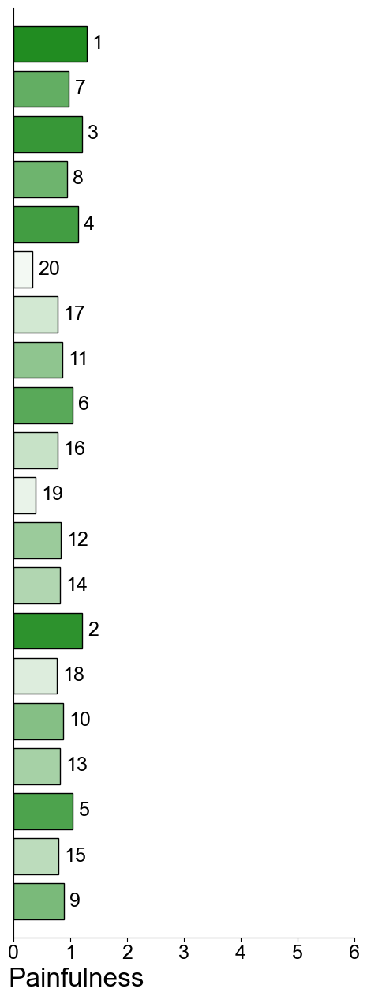

In [731]:
import matplotlib.pyplot as plt
import pandas as pd
import json

emotion = "WUPAIN"
label="Painfulness"
x="GP"
# Load the original dataframes
mean_scores_df_og = pd.read_csv(f'new_csv_with_mean_scores.csv')
mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']

df_sorted = pd.read_csv(f"activity_time_intersection_{x}.csv")
mean_scores_df = pd.read_csv(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/subset_final_data_new_{x}.csv')

df_sorted = df_sorted[df_sorted['Activity'] != 'work, main job']
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# Load unique categories and clean them
with open("/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/test_ATUS", "r") as fp:
    unique_categories = json.load(fp)

# Convert the list of unique categories to lowercase and strip trailing spaces
unique_categories = [cat.lower().strip() for cat in unique_categories]

# Clean and filter dataframes based on unique categories
df_sorted["Activity"] = df_sorted["Activity"].str.lower().str.strip()
mean_scores_df_og["ATUS Supercategory"] = mean_scores_df_og["ATUS Supercategory"].str.lower().str.strip()
mean_scores_df["Activity"] = mean_scores_df["Activity"].str.lower().str.strip()
df_sorted = df_sorted[df_sorted["Activity"].isin(unique_categories)]

common_tasks = set(df_sorted['Activity']) & set(mean_scores_df['Activity'])
df_sorted = df_sorted[df_sorted['Activity'].isin(common_tasks)]
mean_scores_df = mean_scores_df[mean_scores_df['Activity'].isin(common_tasks)]

mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'].isin(common_tasks)]
mean_scores_df_og = mean_scores_df_og.sort_values(by='Mean Score', ascending=True)

# Merge the dataframes for comparison
merged_df_og = pd.merge(mean_scores_df_og, df_sorted, right_on='Activity', left_on='ATUS Supercategory', how='inner')
merged_df_og = pd.merge(merged_df_og, mean_scores_df, right_on='Activity', left_on='Activity', how='inner')

# Sort for plotting
df_sorted = df_sorted.sort_values(by='Average Time Spent', ascending=True)
# mean_scores_df = mean_scores_df.sort_values(by=emotion, ascending=True)

# Calculate the ranks for stress (descending order, highest stress is Rank 1)
# merged_df_og['Stress Rank'] = merged_df_og["Average Time Spent"].rank(ascending=False).astype(int)
merged_df_og['Stress Rank'] = merged_df_og[emotion].rank(ascending=False).astype(int)

# Custom color for the base
# Custom colors
# magenta = (0.0, 0.5, 0.5)  # RGB for teal
# magenta = (1.0, 0.0, 1.0)  # RGB for magenta magenta
magenta= (0.13, 0.55, 0.13) # forestgreen --MAIN
# magenta = (0.85, 0.65, 0.13) # goldenrod
# magenta = (0.86, 0.08, 0.24) # crimson
# magenta = (0.25, 0.41, 0.88) #royalblue
# magenta = (0.8, 0.33, 0.4) #orange
# magenta = (0.55, 0.0, 0.55) #– Dark Purple

# magenta = (0.6, 1.0, 1.0)          # Pastel Teal
# magenta = (1.0, 0.6, 1.0)       # Pastel Magenta
# magenta = (0.6, 0.8, 0.6)   # Pastel Forest Green
# magenta = (1.0, 0.85, 0.55)    # Pastel Goldenrod
# magenta = (1.0, 0.4, 0.5)        # Pastel Crimson
# magenta = (0.7, 0.8, 1.0)      # Pastel Royal Blue
# magenta = (1.0, 0.8, 0.6)         # Pastel Orange
# magenta = (1.0, 0.78, 0.59) #orange new
# magenta= (0.85,0.65,0.45) # Brown time

# Generate color gradient based on rank (Rank 1 = darkest)
# n_ranks = merged_df_og['Stress Rank'].nunique()
n_ranks = len(merged_df_og['Stress Rank'])
color_gradient_score = [(magenta[0], magenta[1], magenta[2], 1 - (rank - 1) / (n_ranks)) for rank in range(1, n_ranks + 5)]

# Map the color based on the rank
color_map_score = dict(zip(range(1, n_ranks + 1), color_gradient_score))
bar_colors_score = merged_df_og['Stress Rank'].map(color_map_score)

# Plotting
# fig, ax = plt.subplots(figsize=(15, 12))

# # Plot the 'Average Time Spent' bars with colors based on rank
# # bars_score = ax.barh(merged_df_og['Activity'], merged_df_og['Average Time Spent'], color=bar_colors_score, edgecolor='black', label='Average Time Spent')
# bars_score = ax.barh(merged_df_og['Activity'], merged_df_og[emotion], color=bar_colors_score, edgecolor='black', label=emotion)

# # Labeling and axis formatting
# ax2.set_xlabel('Tiredness', fontsize=28)
# # ax.set_xlabel('Sadness', fontsize=28)
# ax.set_yticklabels(merged_df_og['Activity'], rotation=10, fontsize=24)
# ax.yaxis.set_label_position("left")

# # Annotate ranks next to the bars
# for i, rank in enumerate(merged_df_og['Stress Rank']):
#     # ax.text(merged_df_og['Average Time Spent'].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')
#     ax.text(merged_df_og[emotion].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')

# # Remove the top and right spines (borders)
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# # Secondary y-axis for Mean Score
# ax2 = ax.twinx()
# # ax2.set_yticklabels([])

# # Tight layout and display
# # plt.tight_layout()
# # plt.show()

# # Plotting
# fig, ax = plt.subplots(figsize=(5, 29))
fig, ax = plt.subplots(figsize=(5, 13))


# ax.set_yticklabels(merged_df_og['Activity'], rotation=0, fontsize=18)
# Plot the 'Average Time Spent' bars
# bars_time = ax.barh(merged_df_og['Activity'], merged_df_og["Average Time Spent"], color=bar_colors_score, edgecolor='black', label='Average Time Spent')
bars_time = ax.barh(merged_df_og['Activity'], merged_df_og[emotion], color=bar_colors_score, edgecolor='black', label=emotion)

# Labeling and axis formatting
# ax.set_xlabel(label, fontsize=24,labelpad=10, x=0.4)
# ax.set_xlabel(label, fontsize=24, x=0.35) # stress, tired
            #   ,labelpad=10, x=0.19)

ax.set_xlabel(label, fontsize=24, x=0.185)

ax.set_xlim(0, 6)  # Set x-axis range from 0 to 6
ax.set_xticks(range(7))
# Remove y-axis tick labels (categories on the left)
ax.set_yticklabels([])
ax.margins(y=0.02) 

# Remove the top and right spines (borders)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Ensure that ticks on the y-axis are also removed
ax.tick_params(left=False)  # Hide y-axis ticks

# Annotate the bars with the stress rank
for i, (activity, rank) in enumerate(zip(merged_df_og['Activity'], merged_df_og['Stress Rank'])):
    # ax.text(merged_df_og["Average Time Spent"].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')
    ax.text(merged_df_og[emotion].iloc[i] + 0.1, i, f'{rank}', va='center', fontsize=18, color='black')

# Secondary y-axis for Mean Score
# ax2 = ax.twinx()
# ax2.set_yticklabels([])

# # Remove the top and right spines for ax2 as well
# ax.yaxis.label.set_size(24)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax.spines['right'].set_visible(False)

# Additional step to remove borders, if necessary
for spine in ['top', 'right']:
    ax.spines[spine].set_color('none')
    ax2.spines[spine].set_color('none')

# Tight layout and display
plt.tight_layout()

# bbox = Bbox([[0.0, 0.0], [3.4, 13]])  #stress, tired
bbox = Bbox([[0.0, 0.0], [2, 13]])
# bbox = Bbox([[0.0, 0.0], [5, 13]])
# plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/{x}/plot_{emotion}_with_ranks.pdf", format='pdf', dpi=300, transparent=True)
plt.savefig(f"/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/plots/HH/plot_HH_{emotion}_with_ranks.pdf", format='pdf', dpi=300,bbox_inches=bbox,pad_inches=0, transparent=True)

plt.show()


In [85]:
import pandas as pd
from scipy.stats import spearmanr

# Load the datasets
x = "female"
mean_scores_df_og = pd.read_csv(f'new_csv_with_mean_scores_{x}.csv')
mean_scores_df_og = mean_scores_df_og[mean_scores_df_og['ATUS Supercategory'] != 'work, main job']

mean_scores_df = pd.read_csv(f'/Users/ruchiraray/Documents/UT Austin/Soc-HHR/BEHAVIOR1kData/survey_analysis/subset_final_data_new_{x}.csv')
mean_scores_df = mean_scores_df[mean_scores_df['Activity'] != 'work, main job']

# Merge the dataframes on common columns: 'Activity' and 'ATUS Supercategory'
merged_df = pd.merge(mean_scores_df_og, mean_scores_df, right_on='Activity', left_on='ATUS Supercategory', how='inner')

# Rank the 'Mean Scores' and 'WUSTRESS' (highest value as rank 1)
# merged_df['Mean Scores Rank'] = merged_df['Mean Score'].rank(ascending=False)
# merged_df['WUSTRESS Rank'] = merged_df['WUSTRESS'].rank(ascending=False)

# Compute Spearman's correlation between the ranks
spearman_corr, p_value = spearmanr(merged_df['Mean Score'], merged_df['WUSTRESS'])

print(f"Spearman's correlation: {spearman_corr}, p-value: {p_value}")


Spearman's correlation: 0.3184394607714195, p-value: 0.033015995686353106
